# HybridDenseViT — Liver Fibrosis Staging (Ultrasound B-mode) | v2 Fixed (2-Session Strategy)

This notebook mirrors the MRI notebook's two-session workflow:
- **Session 1 (SEASON=1):** trains the DenseNet-121-only and ViT-B/16-only ablation baselines, saves a bundle.
- **Session 2 (SEASON=2):** restores the Session-1 bundle, trains the proposed HybridDenseViT, then runs all evaluation (stats, McNemar's test, TTA, XAI, clinical interface).

**Before Session 2:** download `season1_bundle_us.zip` from Session 1's output, upload it as a new Kaggle dataset, and add it as input to the Session 2 notebook.

## Cell 1 — File explorer

In [ ]:
import os
for dirname, _, filenames in os.walk('/kaggle/input'):
    for filename in filenames:
        print(os.path.join(dirname, filename))


## Cell 2 — Install libraries

In [ ]:
import subprocess, sys

def run(cmd):
    r = subprocess.run(cmd, shell=True, capture_output=True, text=True)
    if r.returncode != 0:
        print('ERR:', r.stderr[-400:])

run(f'{sys.executable} -m pip uninstall numpy -y')
run(f'{sys.executable} -m pip install numpy==1.26.4 --quiet')
run(f'{sys.executable} -m pip install opencv-python==4.8.0.76 grad-cam scipy statsmodels --quiet')
print('Done. RESTART KERNEL before Cell 3 if this is the first run.')


## Cell 3 — Imports

In [1]:
import os, cv2, random, gc, warnings, math, pickle
import numpy as np
import pandas as pd
import matplotlib
matplotlib.rcParams['figure.dpi'] = 300
import matplotlib.pyplot as plt
import seaborn as sns
from glob import glob
from tqdm import tqdm
from itertools import cycle

import torch
import torch.nn as nn
import torch.nn.functional as F
import torch.optim as optim
from torch.utils.data import Dataset, DataLoader
from torch.cuda.amp import autocast, GradScaler

import albumentations as A
from albumentations.pytorch import ToTensorV2

from sklearn.model_selection import StratifiedKFold
from sklearn.metrics import (accuracy_score, cohen_kappa_score,
                             classification_report, confusion_matrix,
                             roc_curve, auc)
from sklearn.preprocessing import label_binarize
from scipy import stats as scipy_stats
from statsmodels.stats.contingency_tables import mcnemar

import timm
from pytorch_grad_cam import LayerCAM
from pytorch_grad_cam.utils.image import show_cam_on_image
from pytorch_grad_cam.utils.model_targets import ClassifierOutputTarget

warnings.filterwarnings('ignore')

def seed_everything(seed=42):
    random.seed(seed); np.random.seed(seed)
    torch.manual_seed(seed); torch.cuda.manual_seed_all(seed)
    torch.backends.cudnn.deterministic = True
    torch.backends.cudnn.benchmark = False

seed_everything(42)
print(f'Imports done. PyTorch {torch.__version__} | CUDA {torch.cuda.is_available()}')


Imports done. PyTorch 2.10.0+cu128 | CUDA True


## Cell 4 — Configuration

In [2]:
class CFG:
    IMG_SIZE    = 224
    NUM_CLASSES = 5          # F0 F1 F2 F3 F4
    SEED        = 42
    N_SPLITS    = 5          # reviewer fix #4: was 3, now 5

    BATCH_SIZE  = 8          # US: smaller batch (larger images, 5-class)
    LR          = 1e-4       # full fine-tuning LR (no curriculum freeze for US)
    WEIGHT_DECAY = 1e-4
    EPOCHS      = 40
    PATIENCE    = 8

    # Regularisation
    LABEL_SMOOTHING = 0.05
    DROPOUT_FUSION  = 0.3
    DROPOUT_FC      = 0.2

    # TTA settings
    TTA_STEPS = 5

    DEVICE = 'cuda' if torch.cuda.is_available() else 'cpu'

print('CFG loaded.')
for k, v in vars(CFG).items():
    if not k.startswith('_'):
        print(f'  {k:<22} = {v}')


CFG loaded.
  IMG_SIZE               = 224
  NUM_CLASSES            = 5
  SEED                   = 42
  N_SPLITS               = 5
  BATCH_SIZE             = 8
  LR                     = 0.0001
  WEIGHT_DECAY           = 0.0001
  EPOCHS                 = 40
  PATIENCE               = 8
  LABEL_SMOOTHING        = 0.05
  DROPOUT_FUSION         = 0.3
  DROPOUT_FC             = 0.2
  TTA_STEPS              = 5
  DEVICE                 = cuda


## Cell 5 — Session control (SEASON)

**Set SEASON=1 for first Kaggle session, SEASON=2 for second.**

In [3]:
SEASON   = 2   # 1 = train DenseNet+ViT ablations, 2 = train Hybrid + full eval
FOG_TEST = False   # True = quick 2-epoch smoke test

if FOG_TEST:
    CFG.EPOCHS  = 2
    CFG.PATIENCE = 2

if SEASON == 2:
    import glob as _glob
    import shutil
    # Look for the season1 bundle uploaded as a Kaggle dataset
    src_dirs = _glob.glob('/kaggle/input/datasets/nahidhasanontor/season1-bundle') + _glob.glob('/kaggle/input/*season-1*')
    if src_dirs:
        src_dir = src_dirs[0]
        for f in _glob.glob(os.path.join(src_dir, '*')):
            shutil.copy(f, '.')
        print('Season 1 files restored:', [x for x in os.listdir('.') if x.endswith('.pth') or x.endswith('.pkl')])
    else:
        print('WARNING: season1 bundle not found. Upload season1_bundle_us.zip as a Kaggle dataset.')

print(f'SEASON = {SEASON}  |  FOG_TEST = {FOG_TEST}')


Season 1 files restored: ['abl_vit_state.pkl', 'vit_fold5_best.pth', 'densenet_fold4_best.pth', 'densenet_fold1_best.pth', 'densenet_fold2_best.pth', 'densenet_fold5_best.pth', 'vit_fold3_best.pth', 'vit_fold1_best.pth', 'vit_fold2_best.pth', 'densenet_fold3_best.pth', 'vit_fold4_best.pth', 'abl_dense_state.pkl']
SEASON = 2  |  FOG_TEST = False


## Cell 6 — Load dataset

**Reviewer #1 disclosure:** No patient IDs in this public US dataset. Image-level StratifiedKFold used and explicitly disclosed as a limitation.

In [4]:
# ── UPDATE THIS PATH to match your Kaggle dataset ───────────────────────────
DATA_DIR  = '/kaggle/input/datasets/raufurhidi/ultrasound-dataset/Dataset'
class_map = {'F0': 0, 'F1': 1, 'F2': 2, 'F3': 3, 'F4': 4}

image_paths, labels = [], []
print(f'Loading from: {DATA_DIR}')
print('No patient IDs in US dataset — image-level CV (disclosed as limitation)')

for folder_name, cls_label in class_map.items():
    folder_path = os.path.join(DATA_DIR, folder_name)
    if not os.path.exists(folder_path):
        print(f'  WARNING: {folder_path} not found — skipping'); continue
    imgs = (sorted(glob(os.path.join(folder_path, '*.png'))) +
            sorted(glob(os.path.join(folder_path, '*.jpg'))) +
            sorted(glob(os.path.join(folder_path, '*.jpeg'))))
    for p in imgs:
        image_paths.append(p); labels.append(cls_label)
    print(f'  {folder_name}: {len(imgs)} images')

if len(image_paths) == 0:
    sd = os.path.join(DATA_DIR, 'F0')
    print('ERROR: No files found. Checking F0:')
    for f in sorted(glob(os.path.join(sd, '*')))[:5]: print(f'  {f}')
    raise RuntimeError('No files found — check DATA_DIR')

df = pd.DataFrame({'image_path': image_paths, 'diagnosis': labels})
df = df.sample(frac=1, random_state=CFG.SEED).reset_index(drop=True)

n_images = len(df)
print(f'\nTotal images: {n_images}')
print('\nPer-class breakdown:')
for k, v in class_map.items():
    n = (df['diagnosis'] == v).sum()
    print(f'  {k}: {n:5d} images  ({n/n_images*100:.1f}%)')

# Class weights (inverse-freq) — single imbalance strategy (reviewer fix #5)
counts = np.array([(df['diagnosis']==i).sum()
                   for i in range(CFG.NUM_CLASSES)], dtype=np.float32)
base_weights = counts.sum() / (CFG.NUM_CLASSES * counts)
class_weights = torch.tensor(base_weights, dtype=torch.float32).to(CFG.DEVICE)
print('\nClass weights (inverse freq — single strategy):')
for i, (k, w) in enumerate(zip(class_map.keys(), class_weights.cpu())):
    print(f'  {k}: weight={w:.3f}  ({int(counts[i])} images)')


Loading from: /kaggle/input/datasets/raufurhidi/ultrasound-dataset/Dataset
No patient IDs in US dataset — image-level CV (disclosed as limitation)
  F0: 2114 images
  F1: 861 images
  F2: 793 images
  F3: 857 images
  F4: 1698 images

Total images: 6323

Per-class breakdown:
  F0:  2114 images  (33.4%)
  F1:   861 images  (13.6%)
  F2:   793 images  (12.5%)
  F3:   857 images  (13.6%)
  F4:  1698 images  (26.9%)

Class weights (inverse freq — single strategy):
  F0: weight=0.598  (2114 images)
  F1: weight=1.469  (861 images)
  F2: weight=1.595  (793 images)
  F3: weight=1.476  (857 images)
  F4: weight=0.745  (1698 images)


## Cell 7 — Distribution figure (Fig 1)

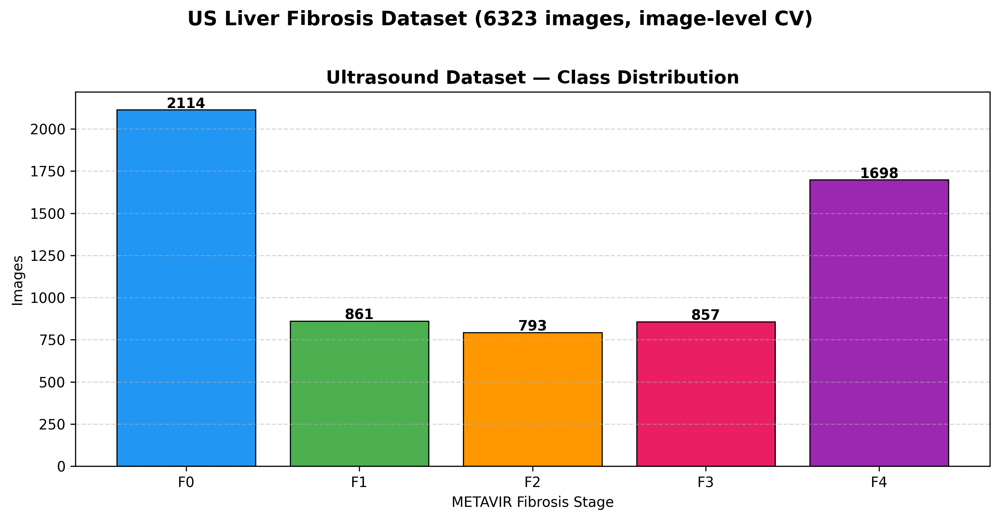

Fig 1 saved (300 DPI).


In [5]:
cls_names  = list(class_map.keys())
bar_colors = ['#2196F3','#4CAF50','#FF9800','#E91E63','#9C27B0']
slc_counts = df['diagnosis'].value_counts().sort_index()
fig, ax = plt.subplots(figsize=(10,5))
ax.bar(cls_names, slc_counts.values, color=bar_colors, edgecolor='black', lw=0.8)
ax.set_title('Ultrasound Dataset — Class Distribution', fontsize=13, fontweight='bold')
ax.set_xlabel('METAVIR Fibrosis Stage'); ax.set_ylabel('Images')
ax.grid(axis='y', ls='--', alpha=0.5)
for i, v in enumerate(slc_counts.values):
    ax.text(i, v+10, str(v), ha='center', fontsize=10, fontweight='bold')
plt.suptitle(f'US Liver Fibrosis Dataset ({n_images} images, image-level CV)',
             fontsize=14, fontweight='bold', y=1.02)
plt.tight_layout()
plt.savefig('fig1_us_distribution.png', dpi=300, bbox_inches='tight')
plt.show()
print('Fig 1 saved (300 DPI).')


## Cell 8 — Sample images (Fig 2)

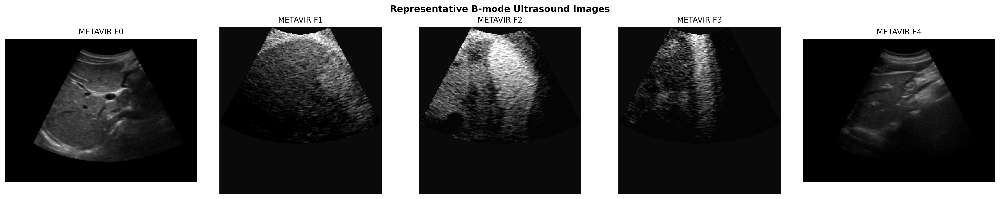

Fig 2 saved (300 DPI).


In [6]:
fig, axes = plt.subplots(1, CFG.NUM_CLASSES, figsize=(20,4))
for cls, ax in enumerate(axes):
    row = df[df['diagnosis']==cls].sample(1, random_state=CFG.SEED).iloc[0]
    img = cv2.cvtColor(cv2.imread(row.image_path), cv2.COLOR_BGR2RGB)
    ax.imshow(img, cmap='gray')
    ax.set_title(f'METAVIR {cls_names[cls]}', fontsize=11)
    ax.axis('off')
plt.suptitle('Representative B-mode Ultrasound Images', fontsize=13, fontweight='bold')
plt.tight_layout()
plt.savefig('fig2_us_samples.png', dpi=300, bbox_inches='tight')
plt.show()
print('Fig 2 saved (300 DPI).')


## Cell 9 — Preprocessing (reviewer fixes #8, #9)

**Reviewer fix #9:** Sharpening removed — amplifies speckle in the same high-frequency band the median filter suppressed.

**Reviewer minor #2:** Symmetric normalisation [0.5,0.5,0.5] used. Applying different ImageNet channel offsets to replicated grayscale channels injects artificial asymmetry.

In [7]:
def clahe_equalized(img_rgb):
    lab = cv2.cvtColor(img_rgb, cv2.COLOR_RGB2LAB)
    l, a, b = cv2.split(lab)
    clahe = cv2.createCLAHE(clipLimit=2.0, tileGridSize=(8,8))
    return cv2.cvtColor(cv2.merge((clahe.apply(l), a, b)), cv2.COLOR_LAB2RGB)

def preprocess_for_model(path):
    """
    US preprocessing pipeline (reviewer-compliant):
      Step 1 — Read -> RGB (handles grayscale US images)
      Step 2 — Median denoise (3x3 speckle reduction)
      Step 3 — CLAHE (local contrast, clipLimit=2.0)
      Sharpening REMOVED — reviewer fix #9: amplifies speckle in same
      high-frequency band the median filter suppressed.
    """
    img = cv2.imread(path)
    if img is None: return None
    if len(img.shape) == 2 or img.shape[2] == 1:
        img = cv2.cvtColor(img, cv2.COLOR_GRAY2RGB)
    else:
        img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    img = cv2.medianBlur(img, 3)    # Step 2: speckle denoise
    img = clahe_equalized(img)      # Step 3: CLAHE
    return img

print('Preprocessing defined (denoise + CLAHE only).')
print('  Sharpening removed: reviewer fix #9')
print('  Grayscale US images auto-converted to 3-channel RGB')


Preprocessing defined (denoise + CLAHE only).
  Sharpening removed: reviewer fix #9
  Grayscale US images auto-converted to 3-channel RGB


## Cell 10 — Preprocessing visualisation (Fig 3)

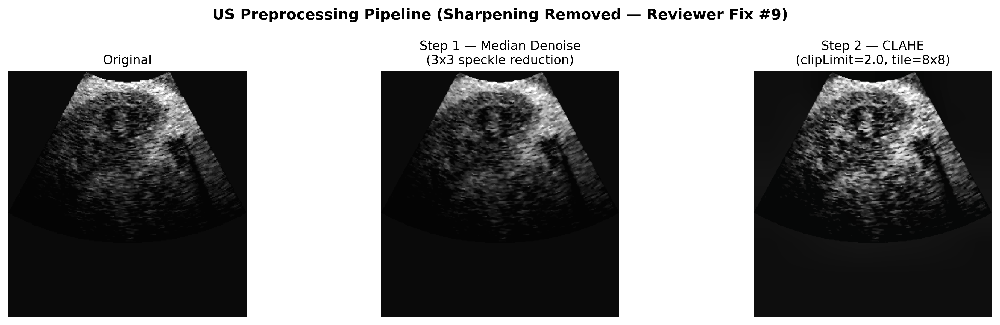

Fig 3 saved (300 DPI).


In [8]:
p   = df.sample(1, random_state=7).iloc[0].image_path
raw = cv2.cvtColor(cv2.imread(p), cv2.COLOR_BGR2RGB)
if len(raw.shape)==2: raw = cv2.cvtColor(raw, cv2.COLOR_GRAY2RGB)
s1  = cv2.medianBlur(raw, 3)
s2  = clahe_equalized(s1)
fig, axes = plt.subplots(1, 3, figsize=(14,4))
for ax, img, t in zip(axes, [raw, s1, s2],
    ['Original',
     'Step 1 — Median Denoise\n(3x3 speckle reduction)',
     'Step 2 — CLAHE\n(clipLimit=2.0, tile=8x8)']):
    ax.imshow(img, cmap='gray'); ax.set_title(t, fontsize=11); ax.axis('off')
plt.suptitle('US Preprocessing Pipeline (Sharpening Removed — Reviewer Fix #9)',
             fontsize=13, fontweight='bold')
plt.tight_layout()
plt.savefig('fig3_us_preprocessing.png', dpi=300, bbox_inches='tight')
plt.show()
print('Fig 3 saved (300 DPI).')


## Cell 11 — Augmentations (reviewer fix #8)

**REMOVED:** `VerticalFlip`, `RandomRotate90`, `HorizontalFlip`, `RandomBrightnessContrast`

**Reviewer rationale:**
- VerticalFlip: inverts near-field/far-field — transducer defines near field at top; inversion is physically meaningless
- RandomRotate90: same depth-axis inversion problem; corrupts time-gain-compensation gradient
- HorizontalFlip: liver has fixed spatial relationship to transducer in B-mode US
- BrightnessContrast: echogenicity IS diagnostic signal — 'discards label-relevant information'

**Reviewer minor #2:** Symmetric normalisation for grayscale-replicated channels.

In [9]:
# Reviewer fix #8: clinically safe augmentations only for B-mode US
train_tfms = A.Compose([
    A.Resize(CFG.IMG_SIZE, CFG.IMG_SIZE),
    # Small rotation only — clinically plausible probe angle variation (<=10 deg)
    A.Rotate(limit=10, border_mode=cv2.BORDER_REFLECT_101, p=0.5),
    A.ShiftScaleRotate(shift_limit=0.04, scale_limit=0.06,
                       rotate_limit=8, border_mode=cv2.BORDER_REFLECT_101, p=0.4),
    # Simulate US acquisition noise (speckle, electronic noise)
    A.GaussNoise(var_limit=(10.0, 40.0), p=0.4),
    A.GaussianBlur(blur_limit=(3,5), p=0.3),
    # Subtle tissue deformation (clinically plausible)
    A.ElasticTransform(alpha=1, sigma=50, alpha_affine=None, p=0.2),
    # Occlusion regularisation
    A.CoarseDropout(max_holes=6, max_height=CFG.IMG_SIZE//12,
                    max_width=CFG.IMG_SIZE//12, fill_value=0, p=0.4),
    # Reviewer minor #2: symmetric normalisation for grayscale->3ch replicated
    A.Normalize(mean=[0.5,0.5,0.5], std=[0.5,0.5,0.5]),
    ToTensorV2()
])
valid_tfms = A.Compose([
    A.Resize(CFG.IMG_SIZE, CFG.IMG_SIZE),
    A.Normalize(mean=[0.5,0.5,0.5], std=[0.5,0.5,0.5]),
    ToTensorV2()
])
print('US augmentations defined (clinically safe for B-mode).')
print('  REMOVED: VerticalFlip, RandomRotate90, HorizontalFlip, BrightnessContrast')


US augmentations defined (clinically safe for B-mode).
  REMOVED: VerticalFlip, RandomRotate90, HorizontalFlip, BrightnessContrast


## Cell 12 — Augmentation visualisation (Fig 4)

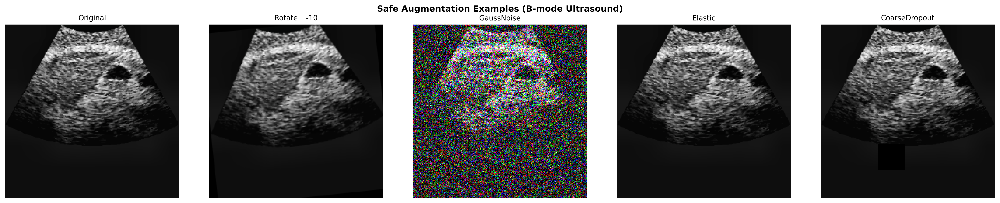

Fig 4 saved (300 DPI).


In [10]:
base = preprocess_for_model(df[df['diagnosis']==2].sample(1,random_state=3).iloc[0].image_path)
base = cv2.resize(base, (CFG.IMG_SIZE, CFG.IMG_SIZE))
aug_pairs = [
    ('Original',      A.Compose([A.Resize(CFG.IMG_SIZE,CFG.IMG_SIZE)])),
    ('Rotate +-10',   A.Compose([A.Resize(CFG.IMG_SIZE,CFG.IMG_SIZE), A.Rotate(limit=10,p=1.0)])),
    ('GaussNoise',    A.Compose([A.Resize(CFG.IMG_SIZE,CFG.IMG_SIZE), A.GaussNoise(var_limit=(10,40),p=1.0)])),
    ('Elastic',       A.Compose([A.Resize(CFG.IMG_SIZE,CFG.IMG_SIZE), A.ElasticTransform(alpha=1,sigma=50,p=1.0)])),
    ('CoarseDropout', A.Compose([A.Resize(CFG.IMG_SIZE,CFG.IMG_SIZE), A.CoarseDropout(max_holes=6,max_height=18,max_width=18,p=1.0)])),
]
fig, axes = plt.subplots(1,5,figsize=(20,4))
for ax, (name, aug) in zip(axes, aug_pairs):
    ax.imshow(aug(image=base)['image'], cmap='gray')
    ax.set_title(name, fontsize=10); ax.axis('off')
plt.suptitle('Safe Augmentation Examples (B-mode Ultrasound)', fontsize=12, fontweight='bold')
plt.tight_layout()
plt.savefig('fig4_us_augmentations.png', dpi=300, bbox_inches='tight')
plt.show()
print('Fig 4 saved (300 DPI).')


## Cell 13 — Dataset class

In [11]:
class LiverDataset(Dataset):
    def __init__(self, df, transform=None):
        self.df = df.reset_index(drop=True)
        self.transform = transform
    def __len__(self): return len(self.df)
    def __getitem__(self, idx):
        row = self.df.iloc[idx]
        img = preprocess_for_model(row.image_path)
        if img is None:
            img = np.zeros((CFG.IMG_SIZE,CFG.IMG_SIZE,3), dtype=np.uint8)
        label = torch.tensor(row.diagnosis, dtype=torch.long)
        if self.transform:
            img = self.transform(image=img)['image']
        return img, label

print('LiverDataset defined.')


LiverDataset defined.


## Cell 14 — Ordinal loss (reviewer fix #5)

Replaces `FocalLoss + WeightedRandomSampler` dual strategy. `WeightedRandomSampler` also removed from DataLoader. Single strategy: class_weights in OrdinalCrossEntropyLoss.

In [12]:
class OrdinalCrossEntropyLoss(nn.Module):
    """
    Reviewer fix #5: replaces FocalLoss + WeightedRandomSampler.
    Single imbalance strategy: CE with class weights.
    Ordinal penalty penalises distant misclassifications more than adjacent.
    """
    def __init__(self, num_classes, class_weights=None,
                 label_smoothing=0.05, ordinal_lambda=0.3):
        super().__init__()
        self.ordinal_lambda = ordinal_lambda
        self.ce = nn.CrossEntropyLoss(weight=class_weights,
                                       label_smoothing=label_smoothing)
        self.register_buffer('ordinal_idx',
                             torch.arange(num_classes, dtype=torch.float32))
    def forward(self, logits, targets):
        ce_loss     = self.ce(logits, targets)
        ordinal_idx = self.ordinal_idx.to(logits.device)
        probs       = F.softmax(logits, dim=1)
        pred_ord    = (probs * ordinal_idx).sum(dim=1)
        ord_penalty = F.mse_loss(pred_ord, targets.float())
        return ce_loss + self.ordinal_lambda * ord_penalty

print('OrdinalCrossEntropyLoss defined.')
print('  Replaces FocalLoss + WeightedRandomSampler (reviewer fix #5)')


OrdinalCrossEntropyLoss defined.
  Replaces FocalLoss + WeightedRandomSampler (reviewer fix #5)


## Cell 15 — Model definitions (3 models for ablation)

**Reviewer fix #6:** Ablation study required.

Same architecture as MRI notebook (unified pipeline). No freeze methods needed for US since full fine-tuning is used.

In [13]:
class DenseNetOnly(nn.Module):
    """Ablation A: DenseNet-121 only."""
    def __init__(self, num_classes=CFG.NUM_CLASSES):
        super().__init__()
        self.backbone = timm.create_model('densenet121', pretrained=True,
                                          num_classes=0, global_pool='avg')
        feat = self.backbone.num_features
        self.head = nn.Sequential(
            nn.BatchNorm1d(feat), nn.Dropout(CFG.DROPOUT_FUSION),
            nn.Linear(feat, 256), nn.GELU(),
            nn.Dropout(CFG.DROPOUT_FC), nn.Linear(256, num_classes))
    def forward(self, x): return self.head(self.backbone(x))

class ViTOnly(nn.Module):
    """Ablation B: ViT-B/16 only."""
    def __init__(self, num_classes=CFG.NUM_CLASSES):
        super().__init__()
        self.backbone = timm.create_model('vit_base_patch16_224', pretrained=True,
                                          num_classes=0, drop_path_rate=0.1)
        feat = self.backbone.num_features
        self.head = nn.Sequential(
            nn.BatchNorm1d(feat), nn.Dropout(CFG.DROPOUT_FUSION),
            nn.Linear(feat, 256), nn.GELU(),
            nn.Dropout(CFG.DROPOUT_FC), nn.Linear(256, num_classes))
    def forward(self, x): return self.head(self.backbone(x))

class HybridDenseViT(nn.Module):
    """
    Proposed model: DenseNet-121 (local texture) + ViT-B/16 (global structure).
    Same architecture as MRI notebook — unified pipeline.
    Fusion: BN -> Drop -> FC512 -> GELU -> Drop -> FC128 -> GELU -> Drop -> FC5
    """
    def __init__(self, num_classes=CFG.NUM_CLASSES):
        super().__init__()
        self.cnn = timm.create_model('densenet121', pretrained=True,
                                      num_classes=0, global_pool='avg')
        self.vit = timm.create_model('vit_base_patch16_224', pretrained=True,
                                      num_classes=0, drop_path_rate=0.1)
        fused = self.cnn.num_features + self.vit.num_features  # 1024+768=1792
        self.fusion_head = nn.Sequential(
            nn.BatchNorm1d(fused), nn.Dropout(CFG.DROPOUT_FUSION),
            nn.Linear(fused, 512), nn.GELU(),
            nn.Dropout(CFG.DROPOUT_FC), nn.Linear(512, 128),
            nn.GELU(), nn.Dropout(CFG.DROPOUT_FC), nn.Linear(128, num_classes))
    def forward(self, x):
        return self.fusion_head(torch.cat([self.cnn(x), self.vit(x)], dim=1))

_m = HybridDenseViT().to(CFG.DEVICE)
_x = torch.zeros(2,3,CFG.IMG_SIZE,CFG.IMG_SIZE).to(CFG.DEVICE)
with torch.no_grad(): _o = _m(_x)
print(f'HybridDenseViT: {tuple(_o.shape)} | {sum(p.numel() for p in _m.parameters())/1e6:.1f}M params')
del _m,_x,_o; gc.collect(); torch.cuda.empty_cache()


model.safetensors:   0%|          | 0.00/32.3M [00:00<?, ?B/s]

model.safetensors:   0%|          | 0.00/346M [00:00<?, ?B/s]

HybridDenseViT: (2, 5) | 93.7M params


## Cell 16 — CV splits (reviewer fix #4 + limitation disclosure)

In [14]:
skf    = StratifiedKFold(n_splits=CFG.N_SPLITS, shuffle=True, random_state=CFG.SEED)
splits = list(skf.split(df, df['diagnosis']))

print(f'StratifiedKFold — {CFG.N_SPLITS} folds (image-level)')
print('Limitation: no patient IDs -> image-level CV. Disclosed in Methods/Limitations.')
print('-'*55)
for fold, (tr, va) in enumerate(splits):
    print(f'  Fold {fold+1}: train {len(tr):5d} | val {len(va):5d} images')
print('-'*55)


StratifiedKFold — 5 folds (image-level)
Limitation: no patient IDs -> image-level CV. Disclosed in Methods/Limitations.
-------------------------------------------------------
  Fold 1: train  5058 | val  1265 images
  Fold 2: train  5058 | val  1265 images
  Fold 3: train  5058 | val  1265 images
  Fold 4: train  5059 | val  1264 images
  Fold 5: train  5059 | val  1264 images
-------------------------------------------------------


## Cell 17 — Training function (full fine-tuning)

**No curriculum freeze for US.** MRI required freeze due to patient-level CV with only 306 patients (severe overfit without freeze). US uses image-level CV with much larger fold sizes — full fine-tuning is stable. Both modalities use the same OrdinalCrossEntropyLoss, AdamW, gradient clipping, and GradScaler.

In [15]:
def train_one_fold(model, fold_idx, model_tag, verbose=True):
    """
    Full fine-tuning (no curriculum freeze for US).
    All reviewer fixes applied:
      #5: OrdinalCrossEntropyLoss with class_weights (no WeightedRandomSampler)
      #4: drop_last=True, gradient clipping, GradScaler AMP
    Justification for no freeze: image-level CV with large fold sizes
    provides sufficient regularisation without backbone freezing.
    """
    train_idx, valid_idx = splits[fold_idx]
    train_df = df.iloc[train_idx].reset_index(drop=True)
    valid_df = df.iloc[valid_idx].reset_index(drop=True)

    train_ds = LiverDataset(train_df, transform=train_tfms)
    valid_ds = LiverDataset(valid_df, transform=valid_tfms)

    # Reviewer fix #5: shuffle=True, NO WeightedRandomSampler
    # Class imbalance handled solely by class_weights in OrdinalCrossEntropyLoss
    train_loader = DataLoader(train_ds, batch_size=CFG.BATCH_SIZE,
                              shuffle=True, num_workers=2,
                              pin_memory=True, drop_last=True)
    valid_loader = DataLoader(valid_ds, batch_size=CFG.BATCH_SIZE,
                              shuffle=False, num_workers=2,
                              pin_memory=True, drop_last=False)

    criterion = OrdinalCrossEntropyLoss(
        num_classes=CFG.NUM_CLASSES,
        class_weights=class_weights,
        label_smoothing=CFG.LABEL_SMOOTHING,
        ordinal_lambda=0.3)

    optimizer = optim.AdamW(model.parameters(), lr=CFG.LR,
                            weight_decay=CFG.WEIGHT_DECAY)
    scheduler = optim.lr_scheduler.ReduceLROnPlateau(
        optimizer, mode='max', factor=0.5, patience=3)
    scaler = GradScaler()

    best_qwk, best_acc, no_improve = -1.0, 0.0, 0
    ckpt_path   = f'{model_tag}_fold{fold_idx+1}_best.pth'
    best_labels, best_preds = [], []
    history = {'tr_loss':[], 'val_loss':[], 'val_qwk':[], 'val_acc':[]}

    for epoch in range(CFG.EPOCHS):
        model.train(); run_loss = run_corr = tot = 0

        for imgs, lbls in train_loader:
            imgs, lbls = imgs.to(CFG.DEVICE), lbls.to(CFG.DEVICE)
            if imgs.size(0) == 1: continue
            optimizer.zero_grad()
            with autocast():
                out  = model(imgs)
                loss = criterion(out, lbls)
            scaler.scale(loss).backward()
            torch.nn.utils.clip_grad_norm_(model.parameters(), 1.0)
            scaler.step(optimizer); scaler.update()
            run_loss += loss.item() * imgs.size(0)
            _, preds  = torch.max(out, 1)
            run_corr += (preds == lbls).sum().item()
            tot      += lbls.size(0)

        tr_loss = run_loss / tot if tot > 0 else 0
        tr_acc  = run_corr / tot if tot > 0 else 0

        model.eval(); vl_loss = vl_tot = 0
        e_preds, e_labels = [], []
        with torch.no_grad():
            for imgs, lbls in valid_loader:
                imgs, lbls = imgs.to(CFG.DEVICE), lbls.to(CFG.DEVICE)
                with autocast(): out = model(imgs); loss = criterion(out,lbls)
                vl_loss += loss.item() * imgs.size(0)
                _, preds = torch.max(out, 1); vl_tot += lbls.size(0)
                e_preds.extend(preds.cpu().numpy())
                e_labels.extend(lbls.cpu().numpy())

        vl_loss /= vl_tot
        val_acc  = accuracy_score(e_labels, e_preds)
        val_qwk  = cohen_kappa_score(e_labels, e_preds, weights='quadratic')
        scheduler.step(val_qwk)

        history['tr_loss'].append(tr_loss); history['val_loss'].append(vl_loss)
        history['val_qwk'].append(val_qwk); history['val_acc'].append(val_acc)

        tag = ' BEST' if val_qwk > best_qwk else ''
        if verbose:
            print(f'  E{epoch+1:02d} lr={optimizer.param_groups[0]["lr"]:.2e}'
                  f' tr={tr_loss:.3f}/{tr_acc:.3f}'
                  f' val={vl_loss:.3f}/{val_acc:.3f}'
                  f' QWK={val_qwk:.4f}{tag}')

        if val_qwk > best_qwk:
            best_qwk=val_qwk; best_acc=val_acc; no_improve=0
            best_labels=e_labels[:]; best_preds=e_preds[:]
            torch.save(model.state_dict(), ckpt_path)
        else:
            no_improve += 1
            if no_improve >= CFG.PATIENCE:
                if verbose: print(f'  Early stop E{epoch+1}.'); break

    return best_qwk, best_acc, best_labels, best_preds, history

print('train_one_fold() defined (full fine-tuning, reviewer fixes applied).')


train_one_fold() defined (full fine-tuning, reviewer fixes applied).


## Cell 18 — SEASON 1: Ablation A — DenseNet-121 only (reviewer fix #6)

In [16]:
if SEASON == 1:
    print('='*60)
    print('ABLATION A -- DenseNet-121 Only (5 folds)')
    print('='*60)
    abl_dense_metrics, abl_dense_oof_labels, abl_dense_oof_preds = [], [], []
    abl_dense_histories = []

    for fold in range(CFG.N_SPLITS):
        print(f'\n--- Fold {fold+1}/{CFG.N_SPLITS} ---')
        gc.collect(); torch.cuda.empty_cache()
        m = DenseNetOnly().to(CFG.DEVICE)
        qwk, acc, lbl, prd, hist = train_one_fold(m, fold, 'densenet')
        abl_dense_metrics.append({'fold':fold+1,'qwk':qwk,'acc':acc})
        abl_dense_oof_labels.extend(lbl)
        abl_dense_oof_preds.extend(prd)
        abl_dense_histories.append(hist)
        print(f'  Fold {fold+1} -> QWK={qwk:.4f}  Acc={acc:.4f}')

    d_qwks = [m['qwk'] for m in abl_dense_metrics]
    d_accs = [m['acc'] for m in abl_dense_metrics]
    print(f'\nDenseNet-121 Only  QWK: {np.mean(d_qwks):.4f} +/- {np.std(d_qwks):.4f}')

    with open('abl_dense_state.pkl','wb') as f:
        pickle.dump({'metrics':abl_dense_metrics,
                     'oof_labels':abl_dense_oof_labels,
                     'oof_preds':abl_dense_oof_preds,
                     'histories':abl_dense_histories}, f)
    print('DenseNet state saved to abl_dense_state.pkl')
else:
    print('SEASON 2 — skipping DenseNet training, loading from bundle.')


SEASON 2 — skipping DenseNet training, loading from bundle.


## Cell 19 — SEASON 1: Ablation B — ViT-B/16 only

In [17]:
if SEASON == 1:
    print('='*60)
    print('ABLATION B -- ViT-B/16 Only (5 folds)')
    print('='*60)
    abl_vit_metrics, abl_vit_oof_labels, abl_vit_oof_preds = [], [], []
    abl_vit_histories = []

    for fold in range(CFG.N_SPLITS):
        print(f'\n--- Fold {fold+1}/{CFG.N_SPLITS} ---')
        gc.collect(); torch.cuda.empty_cache()
        m = ViTOnly().to(CFG.DEVICE)
        qwk, acc, lbl, prd, hist = train_one_fold(m, fold, 'vit')
        abl_vit_metrics.append({'fold':fold+1,'qwk':qwk,'acc':acc})
        abl_vit_oof_labels.extend(lbl)
        abl_vit_oof_preds.extend(prd)
        abl_vit_histories.append(hist)
        print(f'  Fold {fold+1} -> QWK={qwk:.4f}  Acc={acc:.4f}')

    v_qwks = [m['qwk'] for m in abl_vit_metrics]
    v_accs = [m['acc'] for m in abl_vit_metrics]
    print(f'\nViT-B/16 Only  QWK: {np.mean(v_qwks):.4f} +/- {np.std(v_qwks):.4f}')

    with open('abl_vit_state.pkl','wb') as f:
        pickle.dump({'metrics':abl_vit_metrics,
                     'oof_labels':abl_vit_oof_labels,
                     'oof_preds':abl_vit_oof_preds,
                     'histories':abl_vit_histories}, f)
    print('ViT state saved to abl_vit_state.pkl')
else:
    print('SEASON 2 — skipping ViT training, loading from bundle.')


SEASON 2 — skipping ViT training, loading from bundle.


## Cell 20 — SEASON 1: Save bundle and download

**Run this at the end of Session 1, then upload `season1_bundle_us.zip` as a Kaggle dataset before starting Session 2.**

In [18]:
import shutil, glob as _glob

if SEASON == 1:
    os.makedirs('season1_bundle_us', exist_ok=True)
    files_to_bundle = (
        _glob.glob('densenet_fold*_best.pth') +
        _glob.glob('vit_fold*_best.pth') +
        ['abl_dense_state.pkl', 'abl_vit_state.pkl']
    )
    bundled = []
    for f in files_to_bundle:
        if os.path.exists(f):
            shutil.copy(f, 'season1_bundle_us/')
            bundled.append(f)

    shutil.make_archive('season1_bundle_us', 'zip', 'season1_bundle_us')
    print(f'season1_bundle_us.zip created with {len(bundled)} files:')
    for f in bundled: print(f'  {f}')
    print()
    print('NEXT STEPS:')
    print('  1. Download season1_bundle_us.zip from Kaggle output')
    print('  2. Upload it as a new Kaggle dataset (e.g. season1-bundle-us)')
    print('  3. Start a new Kaggle session, add that dataset as input')
    print('  4. Set SEASON = 2 and run all cells')

    from IPython.display import FileLink, display
    os.chdir('/kaggle/working')
    display(FileLink('season1_bundle_us.zip'))
else:
    print('SEASON 2 — bundle already loaded at session start.')


SEASON 2 — bundle already loaded at session start.


## Cell 21 — SEASON 2: Restore ablation results from bundle

In [19]:
if SEASON == 2:
    with open('abl_dense_state.pkl','rb') as f:
        dense_state = pickle.load(f)
    abl_dense_metrics   = dense_state['metrics']
    abl_dense_oof_labels = dense_state['oof_labels']
    abl_dense_oof_preds  = dense_state['oof_preds']
    abl_dense_histories  = dense_state['histories']
    d_qwks = [m['qwk'] for m in abl_dense_metrics]
    d_accs = [m['acc'] for m in abl_dense_metrics]
    print(f'DenseNet loaded: QWK={np.mean(d_qwks):.4f} +/- {np.std(d_qwks):.4f}')

    with open('abl_vit_state.pkl','rb') as f:
        vit_state = pickle.load(f)
    abl_vit_metrics   = vit_state['metrics']
    abl_vit_oof_labels = vit_state['oof_labels']
    abl_vit_oof_preds  = vit_state['oof_preds']
    abl_vit_histories  = vit_state['histories']
    v_qwks = [m['qwk'] for m in abl_vit_metrics]
    v_accs = [m['acc'] for m in abl_vit_metrics]
    print(f'ViT loaded     : QWK={np.mean(v_qwks):.4f} +/- {np.std(v_qwks):.4f}')

    ckpts_d = [f'densenet_fold{i+1}_best.pth' for i in range(CFG.N_SPLITS)]
    ckpts_v = [f'vit_fold{i+1}_best.pth' for i in range(CFG.N_SPLITS)]
    found_d = [c for c in ckpts_d if os.path.exists(c)]
    found_v = [c for c in ckpts_v if os.path.exists(c)]
    print(f'Checkpoint files: {len(found_d)} DenseNet + {len(found_v)} ViT')
    assert len(found_d) == CFG.N_SPLITS, f'Missing DenseNet checkpoints! Found {len(found_d)}/{CFG.N_SPLITS}'
    assert len(found_v) == CFG.N_SPLITS, f'Missing ViT checkpoints! Found {len(found_v)}/{CFG.N_SPLITS}'
else:
    print('SEASON 1 — ablation states saved in Cells 18-19.')


DenseNet loaded: QWK=0.9969 +/- 0.0015
ViT loaded     : QWK=0.9969 +/- 0.0008
Checkpoint files: 5 DenseNet + 5 ViT


## Cell 22 — SEASON 2: Proposed HybridDenseViT (5 folds)

In [20]:
if SEASON == 2:
    print('='*60)
    print('PROPOSED -- HybridDenseViT (5 folds)')
    print('='*60)
    hybrid_metrics, hybrid_oof_labels, hybrid_oof_preds = [], [], []
    hybrid_histories = []

    for fold in range(CFG.N_SPLITS):
        print(f'\n--- Fold {fold+1}/{CFG.N_SPLITS} ---')
        gc.collect(); torch.cuda.empty_cache()
        m = HybridDenseViT().to(CFG.DEVICE)
        qwk, acc, lbl, prd, hist = train_one_fold(m, fold, 'hybrid')
        hybrid_metrics.append({'fold':fold+1,'qwk':qwk,'acc':acc})
        hybrid_oof_labels.extend(lbl)
        hybrid_oof_preds.extend(prd)
        hybrid_histories.append(hist)
        print(f'  Fold {fold+1} -> QWK={qwk:.4f}  Acc={acc:.4f}')

    hybrid_oof_labels = np.array(hybrid_oof_labels)
    hybrid_oof_preds  = np.array(hybrid_oof_preds)
    h_qwks = [m['qwk'] for m in hybrid_metrics]
    h_accs = [m['acc'] for m in hybrid_metrics]
    print(f'\nHybridDenseViT  QWK: {np.mean(h_qwks):.4f} +/- {np.std(h_qwks):.4f}')
else:
    print('SEASON 1 — skipping Hybrid training.')


PROPOSED -- HybridDenseViT (5 folds)

--- Fold 1/5 ---
  E01 lr=1.00e-04 tr=1.861/0.507 val=1.289/0.692 QWK=0.8148 BEST
  E02 lr=1.00e-04 tr=1.391/0.652 val=0.860/0.809 QWK=0.9216 BEST
  E03 lr=1.00e-04 tr=1.135/0.739 val=0.977/0.818 QWK=0.9086
  E04 lr=1.00e-04 tr=0.975/0.797 val=0.712/0.877 QWK=0.9460 BEST
  E05 lr=1.00e-04 tr=0.762/0.868 val=0.579/0.919 QWK=0.9585 BEST
  E06 lr=1.00e-04 tr=0.688/0.892 val=0.530/0.940 QWK=0.9755 BEST
  E07 lr=1.00e-04 tr=0.633/0.912 val=0.488/0.947 QWK=0.9729
  E08 lr=1.00e-04 tr=0.555/0.932 val=0.458/0.953 QWK=0.9770 BEST
  E09 lr=1.00e-04 tr=0.555/0.932 val=0.469/0.956 QWK=0.9704
  E10 lr=1.00e-04 tr=0.547/0.933 val=0.405/0.970 QWK=0.9886 BEST
  E11 lr=1.00e-04 tr=0.512/0.945 val=0.366/0.976 QWK=0.9897 BEST
  E12 lr=1.00e-04 tr=0.469/0.956 val=0.401/0.969 QWK=0.9885
  E13 lr=1.00e-04 tr=0.466/0.954 val=0.407/0.972 QWK=0.9863
  E14 lr=1.00e-04 tr=0.472/0.954 val=0.393/0.975 QWK=0.9885
  E15 lr=5.00e-05 tr=0.401/0.969 val=0.395/0.972 QWK=0.9875
  E16

## Cell 23 — Training curves (Fig 5)

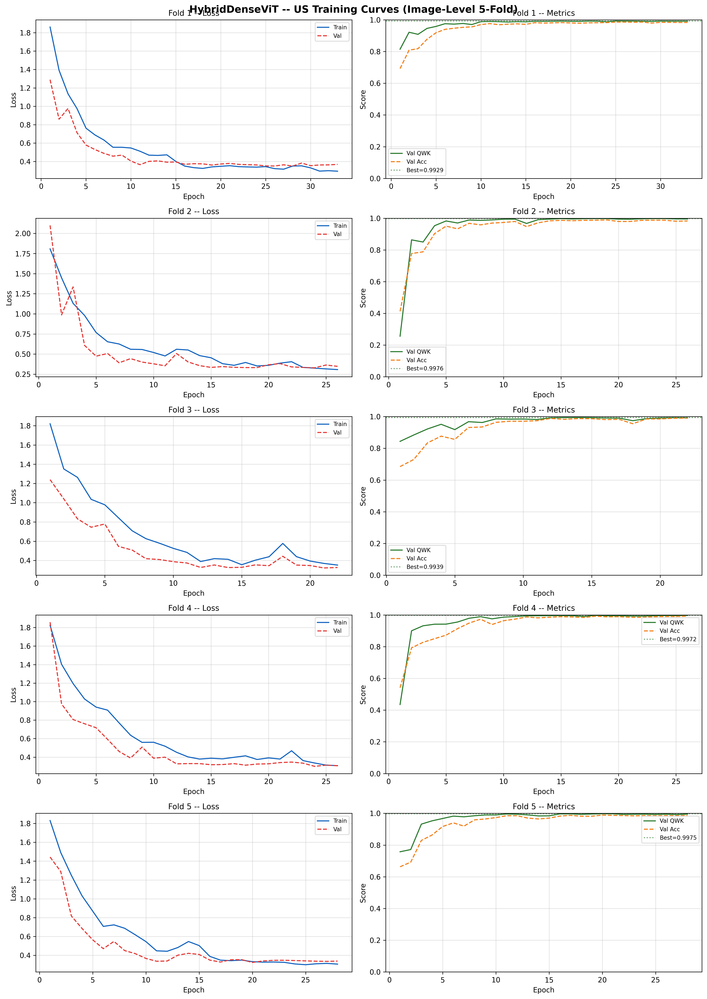

Fig 5 saved (300 DPI).


In [21]:
if SEASON == 2:
    fig, axes = plt.subplots(CFG.N_SPLITS, 2, figsize=(14,4*CFG.N_SPLITS))
    for fi, hist in enumerate(hybrid_histories):
        ep = range(1, len(hist['tr_loss'])+1)
        axes[fi,0].plot(ep, hist['tr_loss'], label='Train', color='#1565C0')
        axes[fi,0].plot(ep, hist['val_loss'], label='Val', color='#E53935', ls='--')
        axes[fi,0].set_title(f'Fold {fi+1} -- Loss', fontsize=11)
        axes[fi,0].set_xlabel('Epoch'); axes[fi,0].set_ylabel('Loss')
        axes[fi,0].legend(fontsize=8); axes[fi,0].grid(True, alpha=0.4)
        axes[fi,1].plot(ep, hist['val_qwk'], label='Val QWK', color='#2E7D32')
        axes[fi,1].plot(ep, hist['val_acc'], label='Val Acc', color='#F57F17', ls='--')
        bq = max(hist['val_qwk'])
        axes[fi,1].axhline(bq, color='#2E7D32', ls=':', alpha=0.7, label=f'Best={bq:.4f}')
        axes[fi,1].set_title(f'Fold {fi+1} -- Metrics', fontsize=11)
        axes[fi,1].set_xlabel('Epoch'); axes[fi,1].set_ylabel('Score')
        axes[fi,1].set_ylim(0,1); axes[fi,1].legend(fontsize=8)
        axes[fi,1].grid(True, alpha=0.4)
    plt.suptitle('HybridDenseViT -- US Training Curves (Image-Level 5-Fold)',
                 fontsize=14, fontweight='bold')
    plt.tight_layout()
    plt.savefig('fig5_us_training_curves.png', dpi=300, bbox_inches='tight')
    plt.show()
    print('Fig 5 saved (300 DPI).')
else:
    print('SEASON 1 -- training curves will be plotted in Season 2.')


## Cell 24 — Statistical summary + ablation table (reviewer fixes #4, #6)

In [22]:
def ci95(vals):
    n  = len(vals)
    ci = scipy_stats.t.interval(0.95, df=n-1,
                                  loc=np.mean(vals), scale=scipy_stats.sem(vals))
    return ci

def summarise(metrics, name):
    qwks=[m['qwk'] for m in metrics]; accs=[m['acc'] for m in metrics]
    q_ci=ci95(qwks); a_ci=ci95(accs)
    return {'Model':name,
            'QWK mean':f'{np.mean(qwks):.4f}', 'QWK std':f'{np.std(qwks):.4f}',
            'QWK 95%CI':f'[{q_ci[0]:.4f},{q_ci[1]:.4f}]',
            'Acc mean':f'{np.mean(accs):.4f}', 'Acc std':f'{np.std(accs):.4f}',
            'Acc 95%CI':f'[{a_ci[0]:.4f},{a_ci[1]:.4f}]'}

if SEASON == 2:
    rows = [
        summarise(abl_dense_metrics, 'DenseNet-121 Only (Baseline A)'),
        summarise(abl_vit_metrics,   'ViT-B/16 Only (Baseline B)'),
        summarise(hybrid_metrics,    'HybridDenseViT (Proposed)'),
    ]
    abl_df = pd.DataFrame(rows)
    print('\n' + '='*75)
    print('ABLATION STUDY -- Image-Level 5-Fold CV (US Liver Fibrosis)')
    print('='*75)
    print(abl_df.to_string(index=False))
    print('='*75)
    print(f'\nPer-fold QWK:')
    print(f'{"Fold":<6} {"DenseNet":>10} {"ViT":>10} {"Hybrid":>10}')
    for i in range(CFG.N_SPLITS):
        print(f'  {i+1:<4} {abl_dense_metrics[i]["qwk"]:>10.4f}'
              f' {abl_vit_metrics[i]["qwk"]:>10.4f}'
              f' {hybrid_metrics[i]["qwk"]:>10.4f}')
    print(f'  {"Mean":<4} {np.mean(d_qwks):>10.4f} {np.mean(v_qwks):>10.4f} {np.mean(h_qwks):>10.4f}')
    print(f'  {"Std":<4} {np.std(d_qwks):>10.4f} {np.std(v_qwks):>10.4f} {np.std(h_qwks):>10.4f}')
else:
    print('SEASON 1 -- stats table will be generated in Season 2.')



ABLATION STUDY -- Image-Level 5-Fold CV (US Liver Fibrosis)
                         Model QWK mean QWK std       QWK 95%CI Acc mean Acc std       Acc 95%CI
DenseNet-121 Only (Baseline A)   0.9969  0.0015 [0.9948,0.9989]   0.9889  0.0020 [0.9862,0.9917]
    ViT-B/16 Only (Baseline B)   0.9969  0.0008 [0.9957,0.9981]   0.9899  0.0018 [0.9873,0.9924]
     HybridDenseViT (Proposed)   0.9958  0.0020 [0.9930,0.9986]   0.9883  0.0021 [0.9853,0.9913]

Per-fold QWK:
Fold     DenseNet        ViT     Hybrid
  1        0.9941     0.9982     0.9929
  2        0.9975     0.9959     0.9976
  3        0.9984     0.9972     0.9939
  4        0.9975     0.9961     0.9972
  5        0.9969     0.9972     0.9975
  Mean     0.9969     0.9969     0.9958
  Std      0.0015     0.0008     0.0020


## Cell 25 — Ablation figures (Fig 6 + Fig 7)

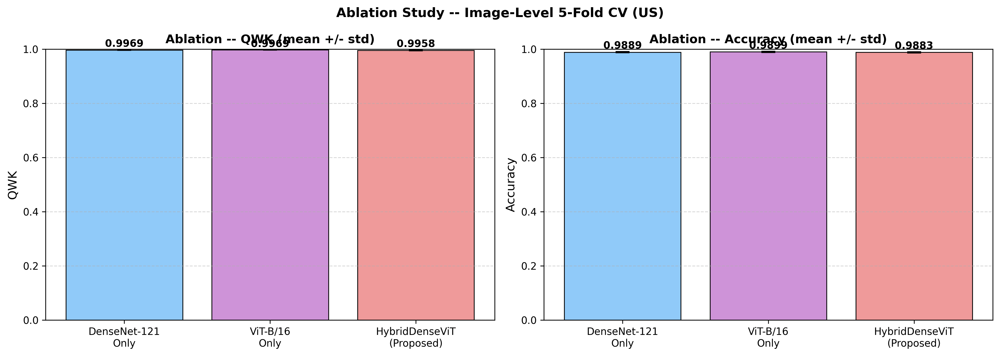

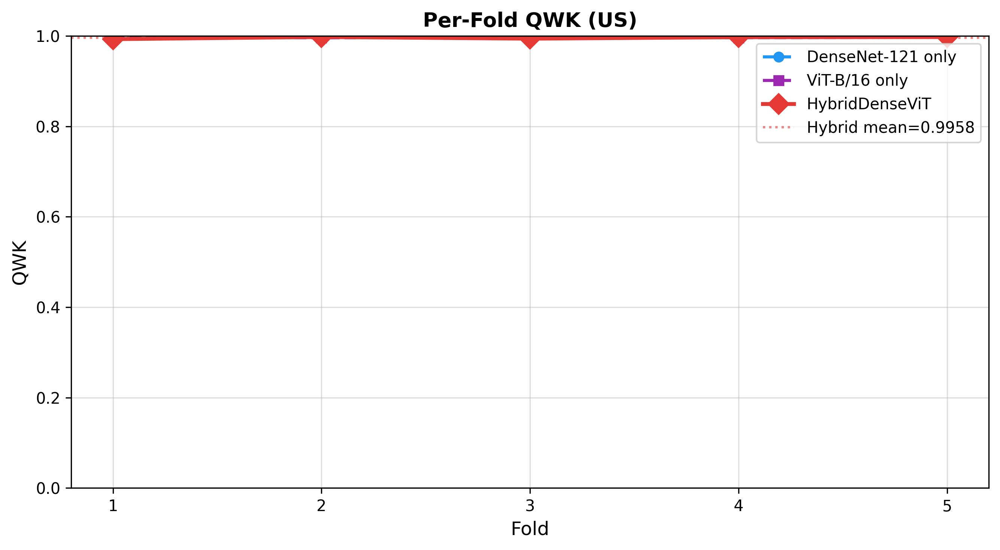

Fig 6+7 saved (300 DPI).


In [23]:
if SEASON == 2:
    mod_names=['DenseNet-121\nOnly','ViT-B/16\nOnly','HybridDenseViT\n(Proposed)']
    bar_colors=['#90CAF9','#CE93D8','#EF9A9A']
    fig, axes = plt.subplots(1,2,figsize=(14,5))
    for ax, vals, stds, title in [
        (axes[0],[np.mean(d_qwks),np.mean(v_qwks),np.mean(h_qwks)],
                  [np.std(d_qwks),np.std(v_qwks),np.std(h_qwks)],'QWK'),
        (axes[1],[np.mean(d_accs),np.mean(v_accs),np.mean(h_accs)],
                  [np.std(d_accs),np.std(v_accs),np.std(h_accs)],'Accuracy')]:
        bars=ax.bar(mod_names,vals,yerr=stds,capsize=7,
                    color=bar_colors,edgecolor='black',lw=0.8)
        ax.set_ylim(0,1.0); ax.set_ylabel(title,fontsize=12)
        ax.set_title(f'Ablation -- {title} (mean +/- std)',fontsize=12,fontweight='bold')
        ax.grid(axis='y',ls='--',alpha=0.5)
        for bar,m,s in zip(bars,vals,stds):
            ax.text(bar.get_x()+bar.get_width()/2,m+s+0.01,
                    f'{m:.4f}',ha='center',fontsize=10,fontweight='bold')
    plt.suptitle('Ablation Study -- Image-Level 5-Fold CV (US)',
                 fontsize=13,fontweight='bold')
    plt.tight_layout()
    plt.savefig('fig6_us_ablation_bars.png',dpi=300,bbox_inches='tight')
    plt.show()

    folds_x=list(range(1,CFG.N_SPLITS+1))
    plt.figure(figsize=(9,5))
    plt.plot(folds_x,d_qwks,'o--',color='#2196F3',lw=2,label='DenseNet-121 only')
    plt.plot(folds_x,v_qwks,'s--',color='#9C27B0',lw=2,label='ViT-B/16 only')
    plt.plot(folds_x,h_qwks,'D-',color='#E53935',lw=2.5,ms=9,label='HybridDenseViT')
    plt.axhline(np.mean(h_qwks),color='#E53935',ls=':',alpha=0.6,
                label=f'Hybrid mean={np.mean(h_qwks):.4f}')
    plt.xlabel('Fold',fontsize=12); plt.ylabel('QWK',fontsize=12)
    plt.title('Per-Fold QWK (US)',fontsize=13,fontweight='bold')
    plt.xticks(folds_x); plt.ylim(0,1.0)
    plt.legend(fontsize=10); plt.grid(True,alpha=0.4)
    plt.tight_layout()
    plt.savefig('fig7_us_per_fold_qwk.png',dpi=300,bbox_inches='tight')
    plt.show()
    print('Fig 6+7 saved (300 DPI).')
else:
    print('SEASON 1 -- ablation figures will be generated in Season 2.')


## Cell 26 — McNemar's test (pairwise model comparison)

Statistical test for significance of performance differences between models. Consistent with MRI notebook.

In [24]:
if SEASON == 2:
    print('='*60)
    print("McNEMAR'S TEST -- Pairwise Model Comparison (paired OOF predictions)")
    print('='*60)
    print('Image-level OOF predictions used (no patient majority vote for US)')

    labels_ref = np.array(abl_dense_oof_labels)

    def mcnemar_pair(name_a, preds_a, name_b, preds_b, labels):
        preds_a = np.array(preds_a); preds_b = np.array(preds_b)
        assert len(preds_a) == len(preds_b) == len(labels), (
            f'Length mismatch: {name_a}={len(preds_a)} {name_b}={len(preds_b)} labels={len(labels)}')
        correct_a = (preds_a == labels)
        correct_b = (preds_b == labels)
        n11 = np.sum(correct_a & correct_b)
        n10 = np.sum(correct_a & ~correct_b)
        n01 = np.sum(~correct_a & correct_b)
        n00 = np.sum(~correct_a & ~correct_b)
        table = [[n11, n10], [n01, n00]]
        exact  = (n10 + n01) < 25
        result = mcnemar(table, exact=exact, correction=True)
        sig = 'significant (p<0.05)' if result.pvalue < 0.05 else 'not significant'
        print(f'\n  {name_a} vs {name_b}')
        print(f'    Discordant pairs: {name_a} only correct={n10}, {name_b} only correct={n01}')
        print(f'    statistic={result.statistic:.4f}  p-value={result.pvalue:.4f}  -> {sig}')
        return result.pvalue

    p_hd = mcnemar_pair('HybridDenseViT', hybrid_oof_preds, 'DenseNet-121', abl_dense_oof_preds, labels_ref)
    p_hv = mcnemar_pair('HybridDenseViT', hybrid_oof_preds, 'ViT-B/16',     abl_vit_oof_preds,   labels_ref)
    p_dv = mcnemar_pair('DenseNet-121',   abl_dense_oof_preds, 'ViT-B/16',  abl_vit_oof_preds,   labels_ref)

    mcnemar_df = pd.DataFrame([
        {'Comparison':'Hybrid vs DenseNet-121',  'p-value':p_hd, 'Significant(p<0.05)':p_hd<0.05},
        {'Comparison':'Hybrid vs ViT-B/16',      'p-value':p_hv, 'Significant(p<0.05)':p_hv<0.05},
        {'Comparison':'DenseNet-121 vs ViT-B/16','p-value':p_dv, 'Significant(p<0.05)':p_dv<0.05},
    ])
    print('\n' + '='*60)
    print(mcnemar_df.to_string(index=False))
    print('='*60)
else:
    print('SEASON 1 -- McNemar test needs Hybrid results (Season 2 only).')


McNEMAR'S TEST -- Pairwise Model Comparison (paired OOF predictions)
Image-level OOF predictions used (no patient majority vote for US)

  HybridDenseViT vs DenseNet-121
    Discordant pairs: HybridDenseViT only correct=27, DenseNet-121 only correct=31
    statistic=0.1552  p-value=0.6936  -> not significant

  HybridDenseViT vs ViT-B/16
    Discordant pairs: HybridDenseViT only correct=33, ViT-B/16 only correct=43
    statistic=1.0658  p-value=0.3019  -> not significant

  DenseNet-121 vs ViT-B/16
    Discordant pairs: DenseNet-121 only correct=35, ViT-B/16 only correct=41
    statistic=0.3289  p-value=0.5663  -> not significant

              Comparison  p-value  Significant(p<0.05)
  Hybrid vs DenseNet-121 0.693641                False
      Hybrid vs ViT-B/16 0.301898                False
DenseNet-121 vs ViT-B/16 0.566280                False


## Cell 27 — OOF metrics + specificity (reviewer fix #4)

In [25]:
if SEASON == 2:
    oof_acc  = accuracy_score(hybrid_oof_labels, hybrid_oof_preds)
    oof_qwk  = cohen_kappa_score(hybrid_oof_labels, hybrid_oof_preds, weights='quadratic')
    cm_all   = confusion_matrix(hybrid_oof_labels, hybrid_oof_preds)
    h_ci     = ci95(h_qwks); a_ci = ci95(h_accs)
    cls_names = list(class_map.keys())

    print('='*60)
    print('PROPOSED MODEL -- OOF Results (Image-Level 5-Fold)')
    print('='*60)
    print(f'  OOF QWK      : {oof_qwk:.4f}')
    print(f'  QWK mean+/-  : {np.mean(h_qwks):.4f} +/- {np.std(h_qwks):.4f}')
    print(f'  QWK 95% CI   : [{h_ci[0]:.4f}, {h_ci[1]:.4f}]')
    print(f'  OOF Accuracy : {oof_acc:.4f}')
    print(f'  Acc mean+/-  : {np.mean(h_accs):.4f} +/- {np.std(h_accs):.4f}')
    print(f'  Acc 95% CI   : [{a_ci[0]:.4f}, {a_ci[1]:.4f}]')
    print()
    print(classification_report(hybrid_oof_labels, hybrid_oof_preds,
                                target_names=cls_names, digits=4))
    print('Specificity per class:')
    for i, cls in enumerate(cls_names):
        tn=cm_all.sum()-(cm_all[i].sum()+cm_all[:,i].sum()-cm_all[i,i])
        fp=cm_all[:,i].sum()-cm_all[i,i]
        print(f'  {cls}: {tn/(tn+fp) if (tn+fp)>0 else 1.0:.4f}')
else:
    print('SEASON 1 -- OOF metrics will be computed in Season 2.')


PROPOSED MODEL -- OOF Results (Image-Level 5-Fold)
  OOF QWK      : 0.9958
  QWK mean+/-  : 0.9958 +/- 0.0020
  QWK 95% CI   : [0.9930, 0.9986]
  OOF Accuracy : 0.9883
  Acc mean+/-  : 0.9883 +/- 0.0021
  Acc 95% CI   : [0.9853, 0.9913]

              precision    recall  f1-score   support

          F0     0.9991    1.0000    0.9995      2114
          F1     0.9777    0.9686    0.9732       861
          F2     0.9660    0.9685    0.9673       793
          F3     0.9812    0.9755    0.9783       857
          F4     0.9941    0.9994    0.9968      1698

    accuracy                         0.9883      6323
   macro avg     0.9836    0.9824    0.9830      6323
weighted avg     0.9883    0.9883    0.9883      6323

Specificity per class:
  F0: 0.9995
  F1: 0.9965
  F2: 0.9951
  F3: 0.9971
  F4: 0.9978


## Cell 28 — Image-Level Error Analysis

For US: no patient IDs available, so error analysis is at image level. Shows which classes are most confused and provides a table of wrong predictions. Consistent with MRI patient-level analysis in spirit.

In [26]:
if SEASON == 2:
    cls_names = list(class_map.keys())

    # Build per-image result dataframe
    oof_result_rows = []
    offset = 0
    for fold, (_, val_idx) in enumerate(splits):
        val_df     = df.iloc[val_idx].reset_index(drop=True)
        fold_size  = len(val_idx)
        fold_labels = hybrid_oof_labels[offset:offset+fold_size]
        fold_preds  = hybrid_oof_preds[offset:offset+fold_size]
        for j in range(fold_size):
            oof_result_rows.append({
                'image_path': val_df.iloc[j]['image_path'],
                'true_label': int(fold_labels[j]),
                'pred_label': int(fold_preds[j]),
                'true_class': cls_names[int(fold_labels[j])],
                'pred_class': cls_names[int(fold_preds[j])],
                'correct'   : fold_labels[j] == fold_preds[j],
            })
        offset += fold_size

    slice_results = pd.DataFrame(oof_result_rows)
    img_acc = slice_results['correct'].mean()

    print('='*60)
    print('IMAGE-LEVEL ERROR ANALYSIS (US -- no patient IDs available)')
    print('='*60)
    print(f'  Total images  : {len(slice_results)}')
    print(f'  Correct       : {slice_results["correct"].sum()} ({img_acc:.1%})')
    print()
    print('Per-class accuracy:')
    for cls in cls_names:
        grp = slice_results[slice_results['true_class']==cls]
        acc = grp['correct'].mean() if len(grp) > 0 else 0
        print(f'  {cls}: {grp["correct"].sum():5d}/{len(grp):5d} correct ({acc:.1%})')

    print()
    print('Most common misclassifications:')
    wrong = slice_results[~slice_results['correct']]
    confusion_counts = wrong.groupby(['true_class','pred_class']).size().reset_index(name='count')
    confusion_counts = confusion_counts.sort_values('count', ascending=False).head(10)
    for _, row in confusion_counts.iterrows():
        print(f'  True {row["true_class"]} -> Pred {row["pred_class"]}: {row["count"]} images')

    # Save wrong predictions
    wrong_out = wrong[['image_path','true_class','pred_class']].copy()
    wrong_out['filename'] = wrong_out['image_path'].apply(os.path.basename)
    wrong_out[['filename','true_class','pred_class']].to_csv('wrong_predictions_us.csv', index=False)
    print(f'\nWrong predictions saved: wrong_predictions_us.csv ({len(wrong)} images)')
else:
    print('SEASON 1 -- error analysis will be run in Season 2.')


IMAGE-LEVEL ERROR ANALYSIS (US -- no patient IDs available)
  Total images  : 6323
  Correct       : 6249 (98.8%)

Per-class accuracy:
  F0:  2114/ 2114 correct (100.0%)
  F1:   834/  861 correct (96.9%)
  F2:   768/  793 correct (96.8%)
  F3:   836/  857 correct (97.5%)
  F4:  1697/ 1698 correct (99.9%)

Most common misclassifications:
  True F1 -> Pred F2: 18 images
  True F2 -> Pred F3: 13 images
  True F2 -> Pred F1: 12 images
  True F3 -> Pred F2: 9 images
  True F3 -> Pred F1: 7 images
  True F3 -> Pred F4: 5 images
  True F1 -> Pred F4: 5 images
  True F1 -> Pred F0: 2 images
  True F1 -> Pred F3: 2 images
  True F4 -> Pred F3: 1 images

Wrong predictions saved: wrong_predictions_us.csv (74 images)


## Cell 29 — Confusion matrices (Fig 8)

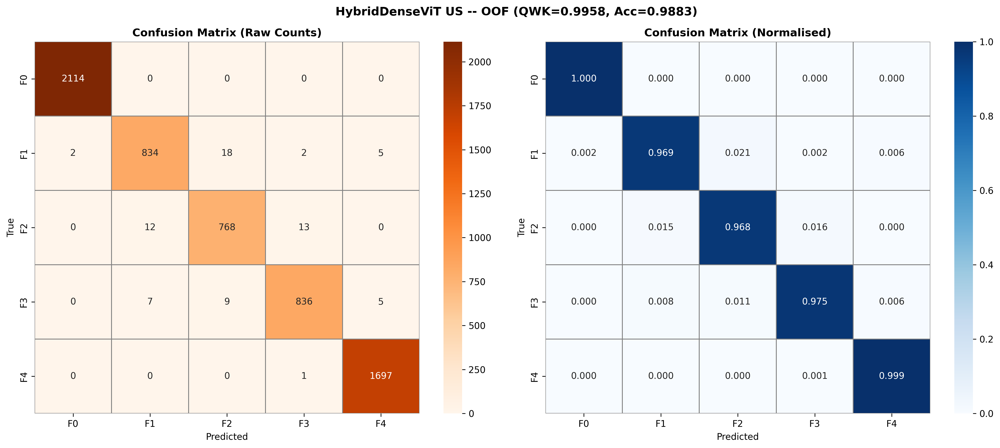

Fig 8 saved (300 DPI).


In [27]:
if SEASON == 2:
    cls_names=list(class_map.keys())
    fig, axes = plt.subplots(1,2,figsize=(16,7))
    sns.heatmap(cm_all,annot=True,fmt='d',cmap='Oranges',ax=axes[0],
                xticklabels=cls_names,yticklabels=cls_names,lw=0.5,linecolor='gray')
    axes[0].set_title('Confusion Matrix (Raw Counts)',fontsize=12,fontweight='bold')
    axes[0].set_xlabel('Predicted'); axes[0].set_ylabel('True')
    cm_norm=cm_all.astype(float)/cm_all.sum(axis=1,keepdims=True)
    sns.heatmap(cm_norm,annot=True,fmt='.3f',cmap='Blues',ax=axes[1],
                xticklabels=cls_names,yticklabels=cls_names,lw=0.5,linecolor='gray')
    axes[1].set_title('Confusion Matrix (Normalised)',fontsize=12,fontweight='bold')
    axes[1].set_xlabel('Predicted'); axes[1].set_ylabel('True')
    plt.suptitle(f'HybridDenseViT US -- OOF (QWK={oof_qwk:.4f}, Acc={oof_acc:.4f})',
                 fontsize=13,fontweight='bold')
    plt.tight_layout()
    plt.savefig('fig8_us_confusion_matrices.png',dpi=300,bbox_inches='tight')
    plt.show()
    print('Fig 8 saved (300 DPI).')
else:
    print('SEASON 1 -- confusion matrix will be generated in Season 2.')


## Cell 30 — Test-Time Augmentation (TTA)

Running TTA on OOF validation sets...


  Fold 1 TTA -> QWK=0.9929  Acc=0.9858


  Fold 2 TTA -> QWK=0.9975  Acc=0.9866


  Fold 3 TTA -> QWK=0.9944  Acc=0.9874


  Fold 4 TTA -> QWK=0.9958  Acc=0.9913


  Fold 5 TTA -> QWK=0.9956  Acc=0.9850

TTA Results:
  No-TTA  QWK=0.9958  Acc=0.9883
  TTA     QWK=0.9952  Acc=0.9872
  QWK gain: -0.0006


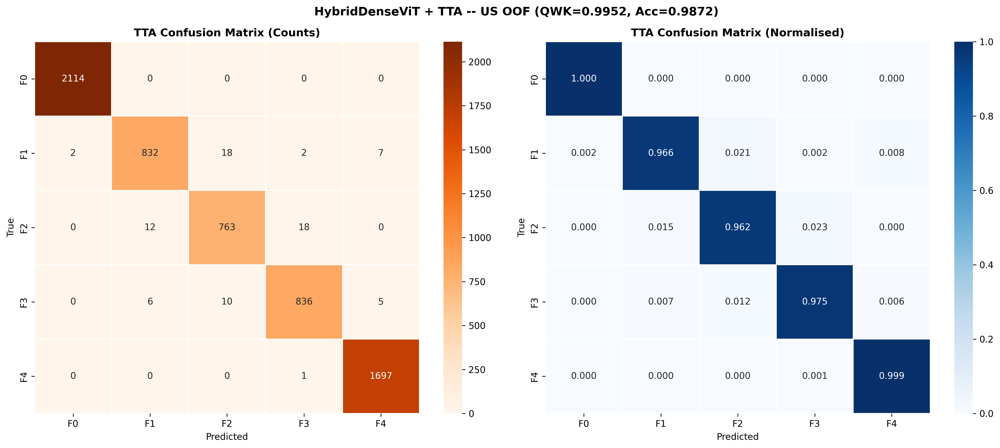

TTA confusion matrix saved (300 DPI).


In [28]:
if SEASON == 2:
    tta_tfms_us = [
        A.Compose([A.Resize(CFG.IMG_SIZE,CFG.IMG_SIZE),
                   A.Normalize(mean=[0.5,0.5,0.5],std=[0.5,0.5,0.5]),ToTensorV2()]),
        A.Compose([A.Resize(CFG.IMG_SIZE,CFG.IMG_SIZE),A.Rotate(limit=5,p=1.0),
                   A.Normalize(mean=[0.5,0.5,0.5],std=[0.5,0.5,0.5]),ToTensorV2()]),
        A.Compose([A.Resize(CFG.IMG_SIZE,CFG.IMG_SIZE),A.Rotate(limit=-5,p=1.0),
                   A.Normalize(mean=[0.5,0.5,0.5],std=[0.5,0.5,0.5]),ToTensorV2()]),
        A.Compose([A.Resize(CFG.IMG_SIZE,CFG.IMG_SIZE),
                   A.ShiftScaleRotate(shift_limit=0.03,scale_limit=0.0,rotate_limit=0,p=1.0),
                   A.Normalize(mean=[0.5,0.5,0.5],std=[0.5,0.5,0.5]),ToTensorV2()]),
        A.Compose([A.Resize(CFG.IMG_SIZE,CFG.IMG_SIZE),
                   A.ShiftScaleRotate(shift_limit=0.0,scale_limit=0.05,rotate_limit=0,p=1.0),
                   A.Normalize(mean=[0.5,0.5,0.5],std=[0.5,0.5,0.5]),ToTensorV2()]),
    ]

    def predict_with_tta_us(model, img_path):
        img = preprocess_for_model(img_path)
        if img is None: return np.ones(CFG.NUM_CLASSES)/CFG.NUM_CLASSES
        probs_list = []
        model.eval()
        with torch.no_grad():
            for tfm in tta_tfms_us:
                inp = tfm(image=img)['image'].unsqueeze(0).to(CFG.DEVICE)
                with autocast(): out = model(inp)
                probs_list.append(F.softmax(out,dim=1).cpu().numpy()[0])
        return np.mean(probs_list, axis=0)

    print('Running TTA on OOF validation sets...')
    tta_oof_probs=[]; tta_oof_labels=[]; tta_oof_preds=[]

    for fold,(_, valid_idx) in enumerate(splits):
        ckpt = f'hybrid_fold{fold+1}_best.pth'
        if not os.path.exists(ckpt):
            print(f'  WARNING: {ckpt} not found'); continue
        gc.collect(); torch.cuda.empty_cache()
        mdl = HybridDenseViT().to(CFG.DEVICE)
        mdl.load_state_dict(torch.load(ckpt, map_location=CFG.DEVICE))
        mdl.eval()
        valid_df = df.iloc[valid_idx].reset_index(drop=True)
        fold_probs, fold_labels_list = [], []
        for _, row in tqdm(valid_df.iterrows(), total=len(valid_df),
                           desc=f'TTA Fold {fold+1}', leave=False):
            prob = predict_with_tta_us(mdl, row.image_path)
            fold_probs.append(prob); fold_labels_list.append(row.diagnosis)
        fold_probs = np.array(fold_probs)
        fold_labels_arr = np.array(fold_labels_list)
        fold_preds = np.argmax(fold_probs, axis=1)
        tta_oof_probs.extend(fold_probs)
        tta_oof_labels.extend(fold_labels_list)
        tta_oof_preds.extend(fold_preds)
        fqwk = cohen_kappa_score(fold_labels_arr, fold_preds, weights='quadratic')
        facc = accuracy_score(fold_labels_arr, fold_preds)
        print(f'  Fold {fold+1} TTA -> QWK={fqwk:.4f}  Acc={facc:.4f}')
        del mdl; gc.collect(); torch.cuda.empty_cache()

    tta_oof_labels=np.array(tta_oof_labels)
    tta_oof_preds=np.array(tta_oof_preds)
    tta_oof_probs_np=np.array(tta_oof_probs)
    tta_qwk=cohen_kappa_score(tta_oof_labels,tta_oof_preds,weights='quadratic')
    tta_acc=accuracy_score(tta_oof_labels,tta_oof_preds)

    print(f'\nTTA Results:')
    print(f'  No-TTA  QWK={oof_qwk:.4f}  Acc={oof_acc:.4f}')
    print(f'  TTA     QWK={tta_qwk:.4f}  Acc={tta_acc:.4f}')
    print(f'  QWK gain: {tta_qwk-oof_qwk:+.4f}')

    tta_cm=confusion_matrix(tta_oof_labels,tta_oof_preds)
    cls_names=list(class_map.keys())
    fig,axes=plt.subplots(1,2,figsize=(16,7))
    sns.heatmap(tta_cm,annot=True,fmt='d',cmap='Oranges',ax=axes[0],
                xticklabels=cls_names,yticklabels=cls_names,lw=0.5)
    axes[0].set_title('TTA Confusion Matrix (Counts)',fontsize=12,fontweight='bold')
    axes[0].set_xlabel('Predicted'); axes[0].set_ylabel('True')
    tta_cm_n=tta_cm.astype(float)/tta_cm.sum(axis=1,keepdims=True)
    sns.heatmap(tta_cm_n,annot=True,fmt='.3f',cmap='Blues',ax=axes[1],
                xticklabels=cls_names,yticklabels=cls_names,lw=0.5)
    axes[1].set_title('TTA Confusion Matrix (Normalised)',fontsize=12,fontweight='bold')
    axes[1].set_xlabel('Predicted'); axes[1].set_ylabel('True')
    plt.suptitle(f'HybridDenseViT + TTA -- US OOF (QWK={tta_qwk:.4f}, Acc={tta_acc:.4f})',
                 fontsize=13,fontweight='bold')
    plt.tight_layout()
    plt.savefig('fig8b_us_tta_confusion.png',dpi=300,bbox_inches='tight')
    plt.show()
    print('TTA confusion matrix saved (300 DPI).')
else:
    print('SEASON 1 -- TTA will run in Season 2.')


## Cell 31 — OOF probabilities for ROC

In [29]:
if SEASON == 2:
    print('Collecting OOF probabilities...')
    hybrid_oof_probs=[]
    for fold,(_, valid_idx) in enumerate(splits):
        ckpt=f'hybrid_fold{fold+1}_best.pth'
        if not os.path.exists(ckpt):
            print(f'  WARNING: {ckpt} not found'); continue
        valid_ds=LiverDataset(df.iloc[valid_idx], transform=valid_tfms)
        valid_ld=DataLoader(valid_ds,batch_size=CFG.BATCH_SIZE,
                            shuffle=False,num_workers=2)
        gc.collect(); torch.cuda.empty_cache()
        mdl=HybridDenseViT().to(CFG.DEVICE)
        mdl.load_state_dict(torch.load(ckpt, map_location=CFG.DEVICE))
        mdl.eval()
        with torch.no_grad():
            for imgs,_ in tqdm(valid_ld,desc=f'Fold {fold+1}',leave=False):
                probs=F.softmax(mdl(imgs.to(CFG.DEVICE)),dim=1).cpu().numpy()
                hybrid_oof_probs.extend(probs)
        del mdl; gc.collect(); torch.cuda.empty_cache()
    hybrid_oof_probs_np=np.array(hybrid_oof_probs)
    print(f'Shape: {hybrid_oof_probs_np.shape}')
else:
    print('SEASON 1 -- probabilities will be collected in Season 2.')


Shape: (6323, 5)


## Cell 32 — ROC / AUC curves (Fig 9)

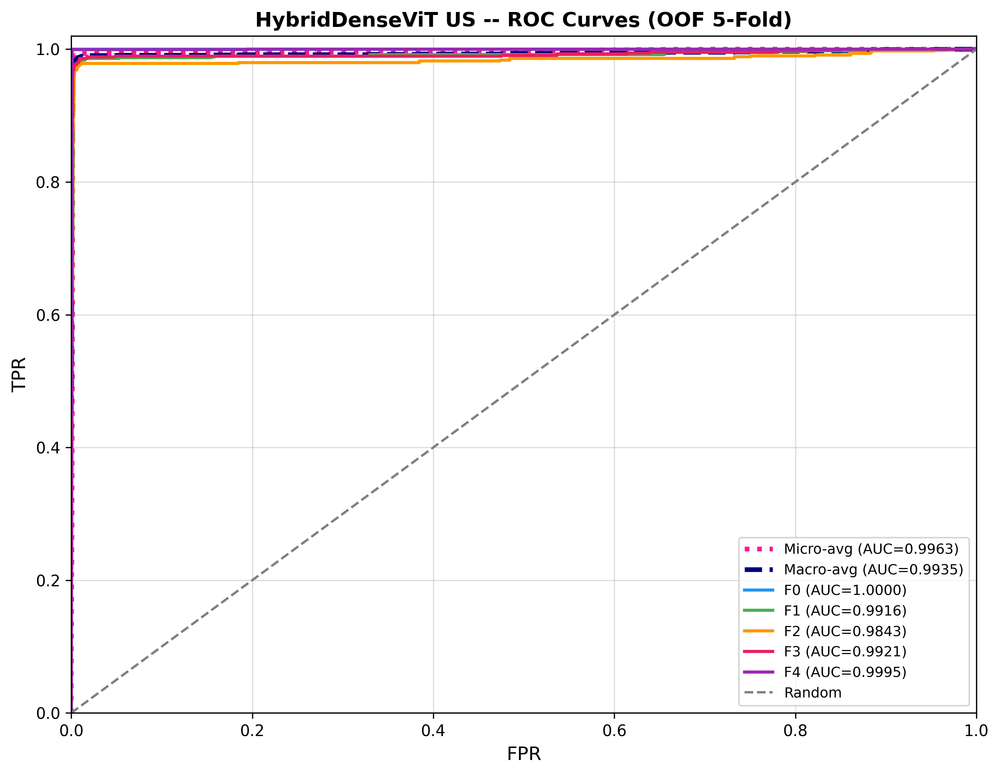

Fig 9 saved (300 DPI).


In [30]:
if SEASON == 2:
    y_bin=label_binarize(hybrid_oof_labels,classes=list(range(CFG.NUM_CLASSES)))
    fpr,tpr,roc_auc={},{},{}
    for i in range(CFG.NUM_CLASSES):
        fpr[i],tpr[i],_=roc_curve(y_bin[:,i],hybrid_oof_probs_np[:,i])
        roc_auc[i]=auc(fpr[i],tpr[i])
    fpr['micro'],tpr['micro'],_=roc_curve(y_bin.ravel(),hybrid_oof_probs_np.ravel())
    roc_auc['micro']=auc(fpr['micro'],tpr['micro'])
    all_fpr=np.unique(np.concatenate([fpr[i] for i in range(CFG.NUM_CLASSES)]))
    mean_tpr=np.mean([np.interp(all_fpr,fpr[i],tpr[i]) for i in range(CFG.NUM_CLASSES)],axis=0)
    fpr['macro'],tpr['macro']=all_fpr,mean_tpr
    roc_auc['macro']=auc(fpr['macro'],tpr['macro'])

    plt.figure(figsize=(9,7))
    plt.plot(fpr['micro'],tpr['micro'],color='deeppink',lw=3,ls=':',
             label=f'Micro-avg (AUC={roc_auc["micro"]:.4f})')
    plt.plot(fpr['macro'],tpr['macro'],color='navy',lw=3,ls='--',
             label=f'Macro-avg (AUC={roc_auc["macro"]:.4f})')
    cls_names=list(class_map.keys())
    for i,col in zip(range(CFG.NUM_CLASSES),
                      cycle(['#2196F3','#4CAF50','#FF9800','#E91E63','#9C27B0'])):
        plt.plot(fpr[i],tpr[i],color=col,lw=2,label=f'{cls_names[i]} (AUC={roc_auc[i]:.4f})')
    plt.plot([0,1],[0,1],'--',color='gray',lw=1.5,label='Random')
    plt.xlim([0,1]); plt.ylim([0,1.02])
    plt.xlabel('FPR',fontsize=12); plt.ylabel('TPR',fontsize=12)
    plt.title('HybridDenseViT US -- ROC Curves (OOF 5-Fold)',
              fontsize=13,fontweight='bold')
    plt.legend(loc='lower right',fontsize=9); plt.grid(True,alpha=0.4)
    plt.tight_layout()
    plt.savefig('fig9_us_roc_curves.png',dpi=300,bbox_inches='tight')
    plt.show()
    print('Fig 9 saved (300 DPI).')
else:
    print('SEASON 1 -- ROC will be generated in Season 2.')


## Cell 33 — XAI: LayerCAM (DenseNet) + Attention Rollout (ViT) — Fig 10

**Reviewer fix #7:** Same Attention Rollout implementation as MRI notebook. Uses forward hooks on `blk.attn` to extract QKV-computed attention — works reliably in eval mode regardless of timm version.

In [31]:
if SEASON == 2:
    def get_attention_maps_us(vit_model, img_tensor):
        """
        Same implementation as MRI notebook (unified pipeline).
        Uses forward hooks on blk.attn to compute attention from QKV.
        Works in eval mode; does not depend on dropout being active.
        """
        attention_maps = []
        hooks = []

        def hook_fn(module, input, output):
            x = input[0]
            B, N, C = x.shape
            num_heads = module.num_heads
            head_dim  = C // num_heads
            qkv = module.qkv(x).reshape(B, N, 3, num_heads, head_dim)
            qkv = qkv.permute(2, 0, 3, 1, 4)
            q, k, _ = qkv.unbind(0)
            scale = head_dim ** -0.5
            attn  = (q @ k.transpose(-2, -1)) * scale
            attn  = attn.softmax(dim=-1)
            attention_maps.append(attn.detach().cpu())

        for blk in vit_model.blocks:
            hooks.append(blk.attn.register_forward_hook(hook_fn))

        vit_model.eval()
        with torch.no_grad(): _ = vit_model(img_tensor)
        for h in hooks: h.remove()
        return attention_maps

    def attention_rollout_us(vit_model, img_tensor):
        maps = get_attention_maps_us(vit_model, img_tensor)
        if len(maps) == 0:
            return np.ones((CFG.IMG_SIZE,CFG.IMG_SIZE), dtype=np.float32)*0.5
        result = torch.eye(maps[0].shape[-1])
        for attn in maps:
            avg = attn.mean(dim=1).squeeze(0)
            aug = avg + torch.eye(avg.size(0))
            aug = aug / aug.sum(dim=-1, keepdim=True)
            result = torch.matmul(aug, result)
        mask = result[0, 1:]
        n    = int(mask.shape[0]**0.5)
        mask = mask.reshape(n,n).numpy()
        mask = (mask-mask.min())/(mask.max()-mask.min()+1e-8)
        return cv2.resize(mask,(CFG.IMG_SIZE,CFG.IMG_SIZE))

    # Load model and verify
    xai_model = HybridDenseViT().to(CFG.DEVICE)
    xai_model.load_state_dict(torch.load('hybrid_fold1_best.pth', map_location=CFG.DEVICE))
    xai_model.eval()
    test_inp = torch.zeros(1,3,CFG.IMG_SIZE,CFG.IMG_SIZE).to(CFG.DEVICE)
    test_map = attention_rollout_us(xai_model.vit, test_inp)
    print(f'Attention rollout test: range={test_map.max()-test_map.min():.4f}')
    print('  OK' if test_map.max()-test_map.min()>0.01 else '  WARNING: near-uniform')

    # Ensemble for predictions
    ckpt_paths_xai=[f'hybrid_fold{i+1}_best.pth' for i in range(CFG.N_SPLITS)
                    if os.path.exists(f'hybrid_fold{i+1}_best.pth')]
    ens_xai=[]
    for ckpt in ckpt_paths_xai:
        m=HybridDenseViT().to(CFG.DEVICE)
        m.load_state_dict(torch.load(ckpt, map_location=CFG.DEVICE))
        m.eval(); ens_xai.append(m)
    if not ens_xai: ens_xai=[xai_model]
    print(f'XAI ensemble: {len(ens_xai)} models.')
    cam_cnn=LayerCAM(model=xai_model, target_layers=[xai_model.cnn.features.norm5])

    cls_names=list(class_map.keys())
    fig,axes=plt.subplots(CFG.NUM_CLASSES,4,figsize=(24,6*CFG.NUM_CLASSES))
    col_titles=['Original Image','Preprocessed (Input)',
                'DenseNet-121 LayerCAM\n(Local Texture Features)',
                'ViT-B/16 Attention Rollout\n(Global Structure Features)']

    for ci in range(CFG.NUM_CLASSES):
        row  = df[df['diagnosis']==ci].sample(1, random_state=ci*7).iloc[0]
        path = row.image_path
        orig = cv2.cvtColor(cv2.imread(path), cv2.COLOR_BGR2RGB)
        orig = cv2.resize(orig,(CFG.IMG_SIZE,CFG.IMG_SIZE))
        prep = preprocess_for_model(path)
        if prep is None: prep=orig.copy()
        prep = cv2.resize(prep,(CFG.IMG_SIZE,CFG.IMG_SIZE))
        flt  = np.clip(prep.astype(np.float32)/255.0,0,1)
        inp  = valid_tfms(image=prep)['image'].unsqueeze(0).to(CFG.DEVICE)

        all_probs=[]
        with torch.no_grad():
            for m in ens_xai:
                p=F.softmax(m(inp),dim=1).cpu().numpy()[0]; all_probs.append(p)
        probs=np.mean(all_probs,axis=0)
        pred=int(np.argmax(probs)); conf=float(probs[pred])
        is_correct=(pred==ci)

        try:
            gcam=cam_cnn(input_tensor=inp,targets=[ClassifierOutputTarget(pred)])[0]
            hm_cnn=show_cam_on_image(flt,gcam,use_rgb=True)
        except Exception as e:
            print(f'  LayerCAM error {cls_names[ci]}: {e}'); hm_cnn=orig.copy()

        rollout=attention_rollout_us(xai_model.vit,inp)
        hm_vit=show_cam_on_image(flt,rollout,use_rgb=True)

        bc='#00C853' if is_correct else '#D50000'
        tc='green' if is_correct else 'red'
        ss='CORRECT' if is_correct else f'WRONG (Pred:{cls_names[pred]})'
        header=(f'[{ss}]  Patient: --  True:{cls_names[ci]}  '
                f'Pred:{cls_names[pred]} ({conf:.1%})\n'
                f'Probs:[{" ".join(f"{p:.2f}" for p in probs)}]')

        for col_i,(ax,img,t) in enumerate(zip(axes[ci],[orig,prep,hm_cnn,hm_vit],col_titles)):
            ax.imshow(img,cmap='gray' if img.ndim==2 else None)
            if ci==0: ax.set_title(t,fontsize=11,fontweight='bold',pad=10)
            for sp in ax.spines.values():
                sp.set_edgecolor(bc); sp.set_linewidth(4); sp.set_visible(True)
            ax.set_xticks([]); ax.set_yticks([])
        axes[ci][0].text(0.0,1.15,header,transform=axes[ci][0].transAxes,
                         fontsize=9,fontweight='bold',color=tc,va='bottom')

    plt.suptitle(
        'XAI: LayerCAM (DenseNet-121) + Attention Rollout (ViT-B/16) -- Ultrasound\n'
        'Reviewer fix #7 | Green=Correct  Red=Wrong',
        fontsize=13,fontweight='bold',y=1.01)
    plt.tight_layout()
    plt.savefig('fig10_us_xai.png',dpi=300,bbox_inches='tight')
    plt.show()
    print('Fig 10 (XAI) saved at 300 DPI.')
    del ens_xai; gc.collect(); torch.cuda.empty_cache()
else:
    print('SEASON 1 -- XAI will be generated in Season 2.')


Attention rollout test: range=0.9966
  OK
XAI ensemble: 5 models.


Fig 10 (XAI) saved at 300 DPI.


## Cell 34 — Clinical interface (5 per class)

Ensemble: 5 models.
Clinical: 25/25 correct (100%)


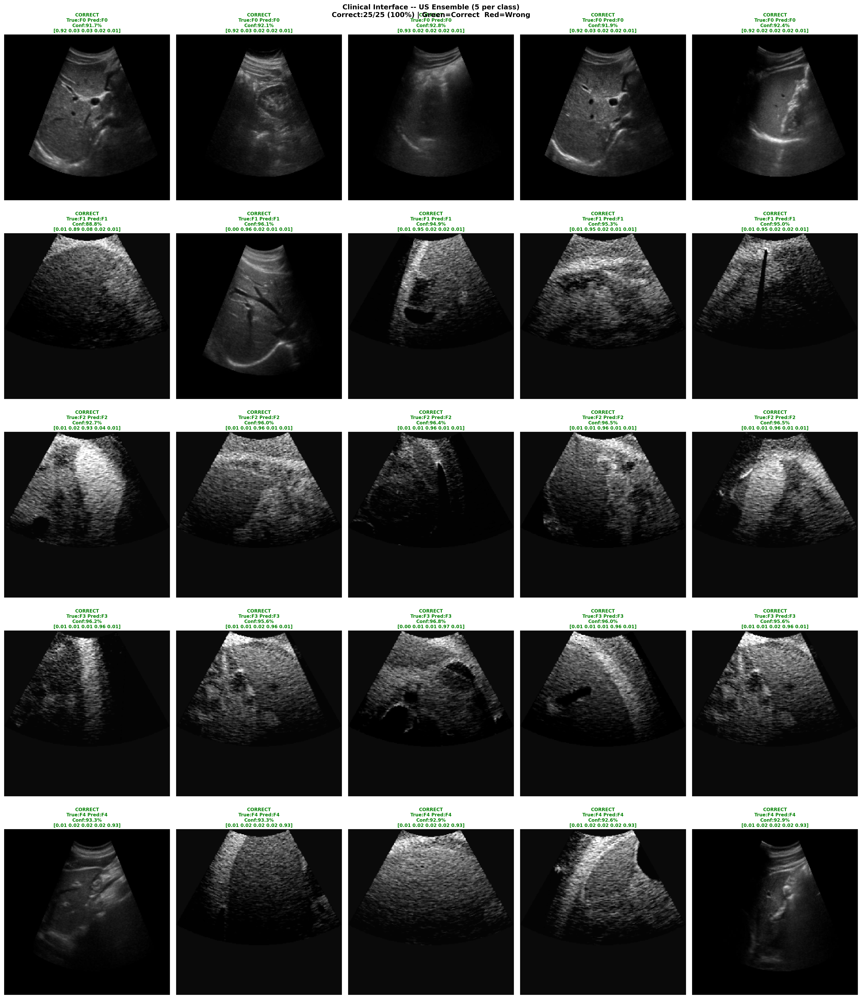

Clinical interface saved (300 DPI).


In [32]:
if SEASON == 2:
    cls_names=list(class_map.keys())
    ckpt_paths_cli=[f'hybrid_fold{i+1}_best.pth' for i in range(CFG.N_SPLITS)
                    if os.path.exists(f'hybrid_fold{i+1}_best.pth')]
    gc.collect(); torch.cuda.empty_cache()
    ens_cli=[]
    for ckpt in ckpt_paths_cli:
        m=HybridDenseViT().to(CFG.DEVICE)
        m.load_state_dict(torch.load(ckpt, map_location=CFG.DEVICE))
        m.eval(); ens_cli.append(m)
    print(f'Ensemble: {len(ens_cli)} models.')

    def ensemble_predict_us(img_path):
        img=preprocess_for_model(img_path)
        if img is None: return 0, 0.0, np.zeros(CFG.NUM_CLASSES)
        img=cv2.resize(img,(CFG.IMG_SIZE,CFG.IMG_SIZE))
        inp=valid_tfms(image=img)['image'].unsqueeze(0).to(CFG.DEVICE)
        all_probs=[]
        with torch.no_grad():
            for m in ens_cli:
                p=F.softmax(m(inp),dim=1).cpu().numpy()[0]; all_probs.append(p)
        avg=np.mean(all_probs,axis=0)
        return int(np.argmax(avg)), float(avg.max()), avg

    sample_rows=[]
    for cls in range(CFG.NUM_CLASSES):
        cls_df=df[df['diagnosis']==cls]
        sample_rows.append(cls_df.sample(min(5,len(cls_df)),random_state=42))
    sample_df=pd.concat(sample_rows).reset_index(drop=True)

    results=[]
    for _,row in sample_df.iterrows():
        pred,conf,probs=ensemble_predict_us(row.image_path)
        results.append({'path':row.image_path,'true':int(row.diagnosis),
                        'pred':pred,'conf':conf,'probs':probs,
                        'correct':pred==int(row.diagnosis)})
    n_correct=sum(r['correct'] for r in results)
    print(f'Clinical: {n_correct}/{len(results)} correct ({n_correct/len(results):.0%})')

    ncols=5; nrows=math.ceil(len(results)/ncols)
    fig,axes=plt.subplots(nrows,ncols,figsize=(ncols*4.2,nrows*5))
    axes=axes.flatten()
    for r,ax in zip(results,axes):
        img=cv2.cvtColor(cv2.imread(r['path']),cv2.COLOR_BGR2RGB)
        img=cv2.resize(img,(CFG.IMG_SIZE,CFG.IMG_SIZE))
        ax.imshow(img,cmap='gray')
        bc='#00C853' if r['correct'] else '#D50000'
        for sp in ax.spines.values(): sp.set_edgecolor(bc); sp.set_linewidth(5)
        tc='green' if r['correct'] else 'red'
        p=r['probs']
        ax.set_title(
            f'{"CORRECT" if r["correct"] else "WRONG"}\n'
            f'True:{cls_names[r["true"]]} Pred:{cls_names[r["pred"]]}\n'
            f'Conf:{r["conf"]:.1%}\n'
            f'[{" ".join(f"{x:.2f}" for x in p)}]',
            fontsize=8,color=tc,fontweight='bold',pad=4)
        ax.axis('off')
    for ax in axes[len(results):]: ax.set_visible(False)
    plt.suptitle(f'Clinical Interface -- US Ensemble (5 per class)\n'
                 f'Correct:{n_correct}/{len(results)} ({n_correct/len(results):.0%}) | '
                 f'Green=Correct  Red=Wrong',
                 fontsize=12,fontweight='bold')
    plt.tight_layout()
    plt.savefig('fig_clinical_us.png',dpi=300,bbox_inches='tight')
    plt.show()
    print('Clinical interface saved (300 DPI).')
    del ens_cli; gc.collect(); torch.cuda.empty_cache()
else:
    print('SEASON 1 -- clinical interface will run in Season 2.')


## Cell 35 — Ensemble model

In [33]:
if SEASON == 2:
    class EnsembleModel(nn.Module):
        def __init__(self, ckpt_paths):
            super().__init__()
            self.models=nn.ModuleList()
            for p in ckpt_paths:
                m=HybridDenseViT()
                m.load_state_dict(torch.load(p, map_location=CFG.DEVICE))
                m.eval(); self.models.append(m)
            print(f'Ensemble: {len(self.models)} fold models.')
        def forward(self, x):
            return torch.mean(torch.stack([F.softmax(m(x),1) for m in self.models]),0)

    avail=[f'hybrid_fold{i+1}_best.pth' for i in range(CFG.N_SPLITS)
           if os.path.exists(f'hybrid_fold{i+1}_best.pth')]
    ens=EnsembleModel(avail).to(CFG.DEVICE)
    torch.save(ens.state_dict(),'ensemble_hybrid_us.pth')
    print('Ensemble saved -> ensemble_hybrid_us.pth')
else:
    print('SEASON 1 -- ensemble will be built in Season 2.')


Ensemble: 5 fold models.
Ensemble saved -> ensemble_hybrid_us.pth


## Cell 36 — Final summary

In [34]:
if SEASON == 2:
    print('='*65)
    print('  FINAL SUMMARY -- HybridDenseViT  Ultrasound B-mode')
    print('='*65)
    print(f'  Dataset : {n_images} images | 5-class METAVIR (F0-F4)')
    print(f'  CV      : StratifiedKFold 5-fold (image-level)')
    print(f'  Note    : No patient IDs in US dataset -- disclosed as limitation')
    print()
    print('  Reviewer fixes applied:')
    print('    #4  : 5-fold CV + 95% CI + McNemar test')
    print('    #5  : OrdinalCrossEntropyLoss (single strategy, no WeightedSampler)')
    print('    #6  : Ablation: DenseNet / ViT / HybridDenseViT')
    print('    #7  : Attention Rollout for ViT XAI (same as MRI notebook)')
    print('    #8  : Removed VerticalFlip/Rotate90/HFlip/BrightnessContrast')
    print('    #9  : Sharpening removed (amplifies speckle noise)')
    print('    m#2 : Symmetric normalisation [0.5,0.5,0.5] for grayscale US')
    print('    m#8 : All figures at 300 DPI')
    print()
    print('  Two-session strategy (mirrors MRI notebook):')
    print('    Session 1 : DenseNet-121-only + ViT-B/16-only ablations -> bundle')
    print('    Session 2 : restore bundle -> train HybridDenseViT -> full evaluation')
    print()
    print('  ABLATION:')
    print(f'    DenseNet-121 only : QWK {np.mean(d_qwks):.4f} +/- {np.std(d_qwks):.4f}')
    print(f'    ViT-B/16 only     : QWK {np.mean(v_qwks):.4f} +/- {np.std(v_qwks):.4f}')
    print(f'    HybridDenseViT    : QWK {np.mean(h_qwks):.4f} +/- {np.std(h_qwks):.4f}  <- proposed')
    print()
    print(f'  OOF QWK    : {oof_qwk:.4f}')
    print(f'  OOF Acc    : {oof_acc:.4f}')
    print(f'  TTA QWK    : {tta_qwk:.4f}  (+{tta_qwk-oof_qwk:.4f})')
    print(f'  QWK 95%CI  : [{h_ci[0]:.4f}, {h_ci[1]:.4f}]')
    print()
    print('  XAI: LayerCAM (DenseNet) + Attention Rollout (ViT)  OK')
    figs=sorted([f for f in os.listdir('.') if f.startswith('fig') and f.endswith('.png')])
    print(f'  Saved {len(figs)} figures at 300 DPI')
    for f in figs: print(f'    {f}')
else:
    print('SEASON 1 training complete.')
    print('Download season1_bundle_us.zip and upload as a Kaggle dataset.')
    print('Then set SEASON=2 and run all cells in a new session.')


  FINAL SUMMARY -- HybridDenseViT  Ultrasound B-mode
  Dataset : 6323 images | 5-class METAVIR (F0-F4)
  CV      : StratifiedKFold 5-fold (image-level)
  Note    : No patient IDs in US dataset -- disclosed as limitation

  Reviewer fixes applied:
    #4  : 5-fold CV + 95% CI + McNemar test
    #5  : OrdinalCrossEntropyLoss (single strategy, no WeightedSampler)
    #6  : Ablation: DenseNet / ViT / HybridDenseViT
    #7  : Attention Rollout for ViT XAI (same as MRI notebook)
    #8  : Removed VerticalFlip/Rotate90/HFlip/BrightnessContrast
    #9  : Sharpening removed (amplifies speckle noise)
    m#2 : Symmetric normalisation [0.5,0.5,0.5] for grayscale US
    m#8 : All figures at 300 DPI

  Two-session strategy (mirrors MRI notebook):
    Session 1 : DenseNet-121-only + ViT-B/16-only ablations -> bundle
    Session 2 : restore bundle -> train HybridDenseViT -> full evaluation

  ABLATION:
    DenseNet-121 only : QWK 0.9969 +/- 0.0015
    ViT-B/16 only     : QWK 0.9969 +/- 0.0008
    Hyb

## Cell 37 — Zip outputs

In [35]:
import zipfile

def zip_outputs(zip_name='us_outputs.zip'):
    with zipfile.ZipFile(zip_name, 'w', zipfile.ZIP_DEFLATED) as zf:
        for f in os.listdir('.'):
            if f.endswith('.png') or f.endswith('.pth') or f.endswith('.csv'):
                zf.write(f)
                print(f'  Added: {f}')
    print(f'Created: {zip_name}')

zip_outputs()

from IPython.display import FileLink, display
os.chdir('/kaggle/working')
display(FileLink('us_outputs.zip'))


  Added: fig8b_us_tta_confusion.png
  Added: fig8_us_confusion_matrices.png
  Added: fig6_us_ablation_bars.png
  Added: fig5_us_training_curves.png
  Added: hybrid_fold4_best.pth
  Added: vit_fold5_best.pth
  Added: fig7_us_per_fold_qwk.png
  Added: densenet_fold4_best.pth
  Added: fig_clinical_us.png
  Added: densenet_fold1_best.pth
  Added: fig2_us_samples.png
  Added: densenet_fold2_best.pth
  Added: hybrid_fold1_best.pth
  Added: densenet_fold5_best.pth
  Added: ensemble_hybrid_us.pth
  Added: hybrid_fold5_best.pth
  Added: vit_fold3_best.pth
  Added: vit_fold1_best.pth
  Added: hybrid_fold3_best.pth
  Added: hybrid_fold2_best.pth
  Added: vit_fold2_best.pth
  Added: wrong_predictions_us.csv
  Added: fig9_us_roc_curves.png
  Added: fig4_us_augmentations.png
  Added: fig10_us_xai.png
  Added: densenet_fold3_best.pth
  Added: fig1_us_distribution.png
  Added: vit_fold4_best.pth
  Added: fig3_us_preprocessing.png
Created: us_outputs.zip


/kaggle/working/us_outputs.zip